In [141]:
import pandas as pd
import numpy as np

import matplotlib.pyplot as plt
import seaborn as sns
import plotly.graph_objects as go
import plotly.offline
from plotly.subplots import make_subplots
import plotly.express as px
from sklearn.preprocessing import MinMaxScaler

from pptoolbox.platform.preprocessing import preprocess_v2
from pptoolbox.preprocessing import SNV, MSC, SavitzkyGolay, Detrend
from pptoolbox.visualization import (plot_spectra, plot_loadings, plot_scree, fit_pca,
                                               generate_pc_df, plot_svp, initialize_theme, spectral_vector_properties)

from sklearn.feature_selection import f_classif, mutual_info_classif, chi2

In [142]:
plotly.offline.init_notebook_mode()
qualitative_cmap, diverging_cmap, light_cmap = initialize_theme()

# import

In [143]:
import os
import sys
sys.path.append(os.path.dirname(os.getcwd()))

raw_df = pd.read_csv('../data/raw/spectra_241127.csv')
label_df = pd.read_csv('../data/processed/label.csv')
print(raw_df.shape, label_df.shape)


(518, 34) (78, 4)


In [144]:
raw_df.head()

,lot_id,active,analyzer_id,raw_data_mini,raw_data_neo,company_id,dark_ref_data_mini,dark_ref_data_neo,dark_ref_scan_time,date_scanned,...,white_ref_scan_time,raw_data,dark_ref_data,white_ref_data,scope_data,specimen_id,lot_name,analyser_id,product_id,product_name
0,84412,1,109,"[{""wavelength"": 290.4354553222656, ""reflectanc...","[{""wavelength"": 927.1248168945312, ""reflectanc...",1313,"[-4.585029125213623, -1.8277339935302734, 1.85...","[9.870936393737793, -7.298366546630859, 10.386...",1732246512,1732246588,...,1732246546,NaN,NaN,NaN,NaN,496472,PNAL11-T,109,6726,Cocoa Nibs
1,84412,1,109,"[{""wavelength"": 290.4354553222656, ""reflectanc...","[{""wavelength"": 927.1248168945312, ""reflectanc...",1313,"[-4.585029125213623, -1.8277339935302734, 1.85...","[9.870936393737793, -7.298366546630859, 10.386...",1732246512,1732246618,...,1732246546,NaN,NaN,NaN,NaN,496473,PNAL11-T,109,6726,Cocoa Nibs
2,84412,1,109,"[{""wavelength"": 290.4354553222656, ""reflectanc...","[{""wavelength"": 927.1248168945312, ""reflectanc...",1313,"[-4.585029125213623, -1.8277339935302734, 1.85...","[9.870936393737793, -7.298366546630859, 10.386...",1732246512,1732246656,...,1732246546,NaN,NaN,NaN,NaN,496474,PNAL11-T,109,6726,Cocoa Nibs
3,84412,1,109,"[{""wavelength"": 290.4354553222656, ""reflectanc...","[{""wavelength"": 927.1248168945312, ""reflectanc...",1313,"[-4.585029125213623, -1.8277339935302734, 1.85...","[9.870936393737793, -7.298366546630859, 10.386...",1732246512,1732246691,...,1732246546,NaN,NaN,NaN,NaN,496475,PNAL11-T,109,6726,Cocoa Nibs
4,84412,1,109,"[{""wavelength"": 290.4354553222656, ""reflectanc...","[{""wavelength"": 927.1248168945312, ""reflectanc...",1313,"[-4.585029125213623, -1.8277339935302734, 1.85...","[9.870936393737793, -7.298366546630859, 10.386...",1732246512,1732246730,...,1732246546,NaN,NaN,NaN,NaN,496476,PNAL11-T,109,6726,Cocoa Nibs


In [145]:
label_df

,lot_id,lot_name,Flavor,Processing
0,84412,PNAL11-T,Huila,Roasted
1,84413,PNAL12-T,Huila,Roasted
2,84414,PNAL27-T,Huila,Roasted
3,84415,PNAL28-T,Huila,Roasted
4,84416,PNAL29-T,Huila,Roasted
...,...,...,...,...
73,84485,PNAL78-G,Tumaco,Unroasted
74,84486,PNAL79-G,Tumaco,Unroasted
75,84487,PNAL84-G,Tumaco,Unroasted
76,84488,PNAL85-G,Tumaco,Unroasted


# select label

In [146]:
label = 'Roasted'
label_df = label_df[label_df['Processing']==label]
label_df.shape

(39, 4)

In [147]:
label_df_og = label_df.copy(deep=True)
label_df = label_df.drop(columns = ['lot_name','Processing'])

X_visnir, X_exnir, label_df, datatype = preprocess_v2(raw_df, label_df)

In [148]:
X_visnir.shape, X_exnir.shape

((273, 191), (273, 89))

In [149]:
spectra = dict({
    'visnir' : X_visnir,
    'exnir' : X_exnir
})

In [150]:
label_type_list = ['clf']
param_label_map = dict(zip(label_df.columns, label_type_list))
param_label_map

{'Flavor': 'clf'}

# Check for Outliers

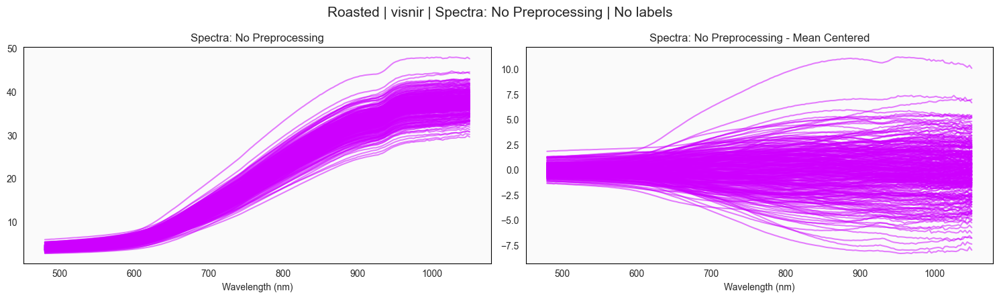

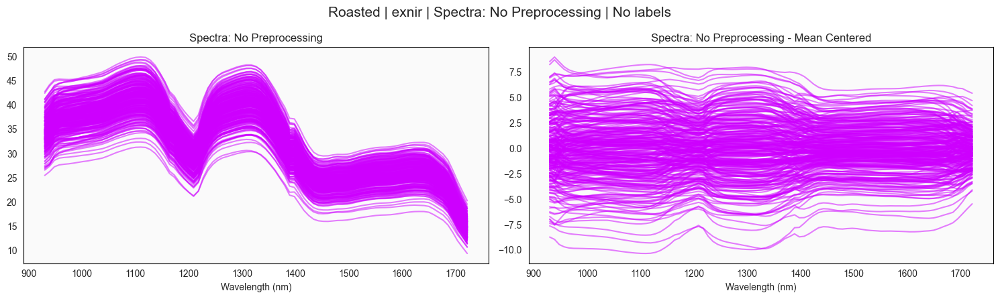

In [151]:
PREPROCESSING = 'No Preprocessing'
SAMPLE_TYPE = f'{label}'
cmap=sns.color_palette()

for spectrum in spectra:
    SAMPLE_TYPE = f'{label} | {spectrum}'
    raw_df = spectra[spectrum]

    plot_spectra(raw_df, labels=None,
             spec_prep=PREPROCESSING,
             sample_type=SAMPLE_TYPE,
             cmap=cmap);

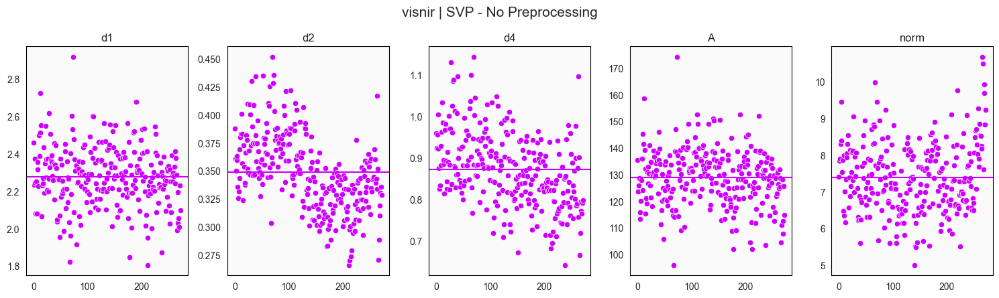

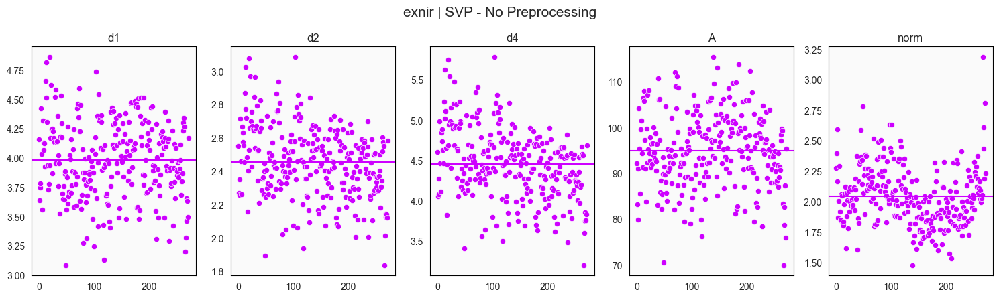

In [152]:
for spectrum in spectra:
    SAMPLE_TYPE = f'{label} | {spectrum}'
    raw_df = spectra[spectrum]
    plot_svp(raw_df, title=f'{spectrum} | SVP - No Preprocessing')

## identify outlier sample

In [ ]:
# plot_svp(raw_df, title='SVP - No Preprocessing')

# #label cutoff

# cutoff = 5

# raw_df_check = pd.DataFrame(raw_df)
# svp_arr = spectral_vector_properties(raw_df_check, True)

# norm_data = svp_arr['norm']
# norm_ax = plt.gcf().axes[4]
# norm_data

# for idx in range(len(norm_data)):
#     if norm_data.iloc[idx] > cutoff:  
#         norm_ax.text(idx, norm_data.iloc[idx], norm_data.index[idx], 
#                      fontsize=10, color='red') 

# plt.draw()

In [ ]:
# anomalous_df = svp_arr[svp_arr['norm']>cutoff]
# anomalous_df

In [ ]:
# anomalous_df = anomalous_df.reset_index()
# check_df = raw_df.reset_index()
# check_df = check_df[check_df['lot_id'].isin(anomalous_df['lot_id'])]

# check_df_labels = check_df[['lot_id']]
# check_df_labels['label'] = check_df['lot_id']
# check_df_labels= check_df_labels.set_index('lot_id')

# check_df = check_df.set_index('lot_id')

# plot_spectra(check_df, labels=check_df_labels,
#              spec_prep=PREPROCESSING,
#              sample_type=SAMPLE_TYPE,
#              cmap=cmap);

In [ ]:
# filter out the outlier scans
# mask = (raw_df.iloc[:, -1] < 80) & (raw_df.iloc[:, -1] > 10)
# mask
# raw_df = raw_df.loc[mask, :]
# label_df = label_df.loc[mask, :]

# No Preprocessing

In [153]:
spectra_meta = {}

In [154]:
# CONFIGS
# plot_df = raw_df.copy()
cmap=sns.color_palette()

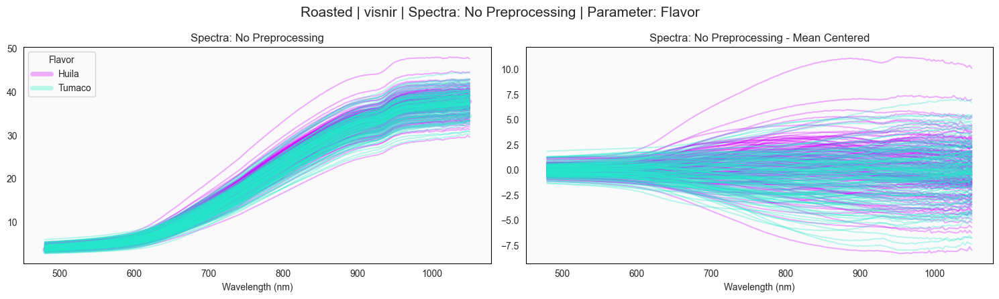

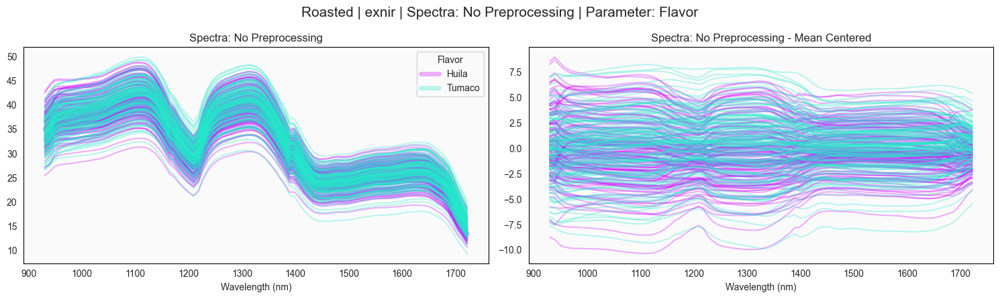

In [155]:
for spectrum in spectra:
    SAMPLE_TYPE = f'{label} | {spectrum}'
    plot_df = spectra[spectrum]

    spectra_meta = {
        **spectra_meta,
        f'{spectrum}_plot_df' : plot_df
    }
    
    for param, label_type in param_label_map.items():
        plot_spectra(plot_df, labels=label_df[[param]],
                    label_type=label_type,
                    spec_prep=PREPROCESSING,
                    sample_type=SAMPLE_TYPE,
                    cmap=cmap)

Total Explained Variance: 99.617% 
    Number of Components: 3
Total Explained Variance: 99.430% 
    Number of Components: 3


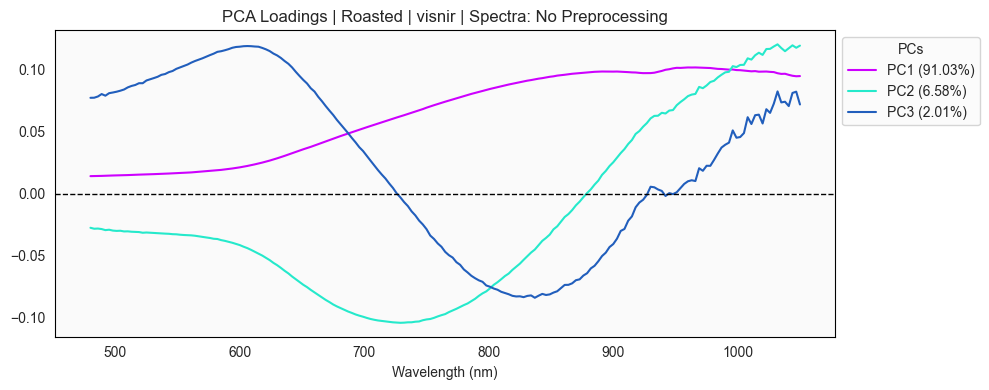

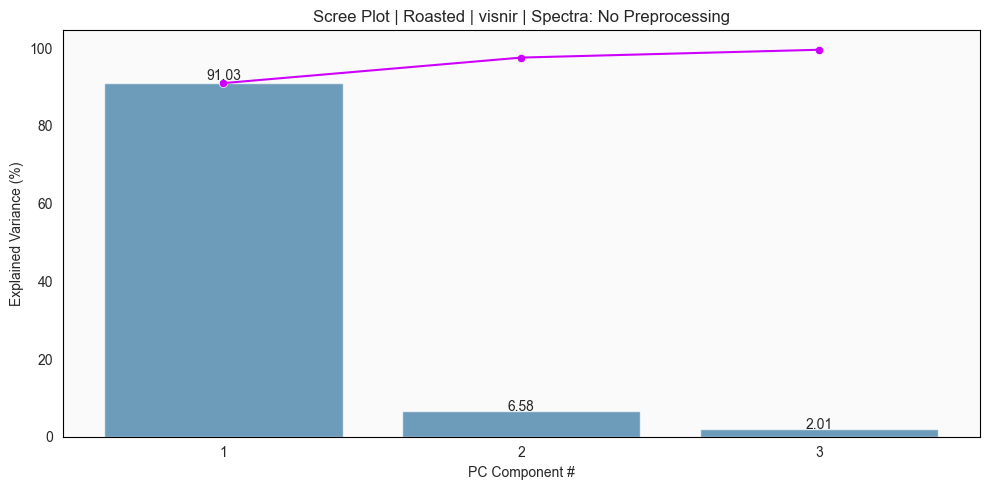

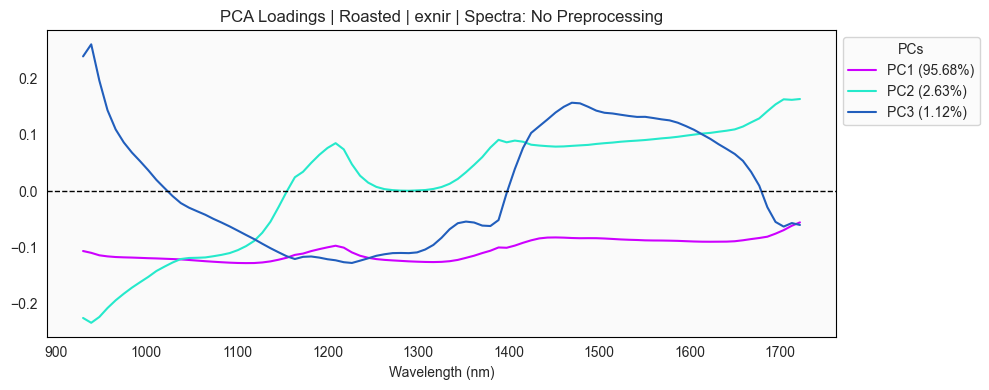

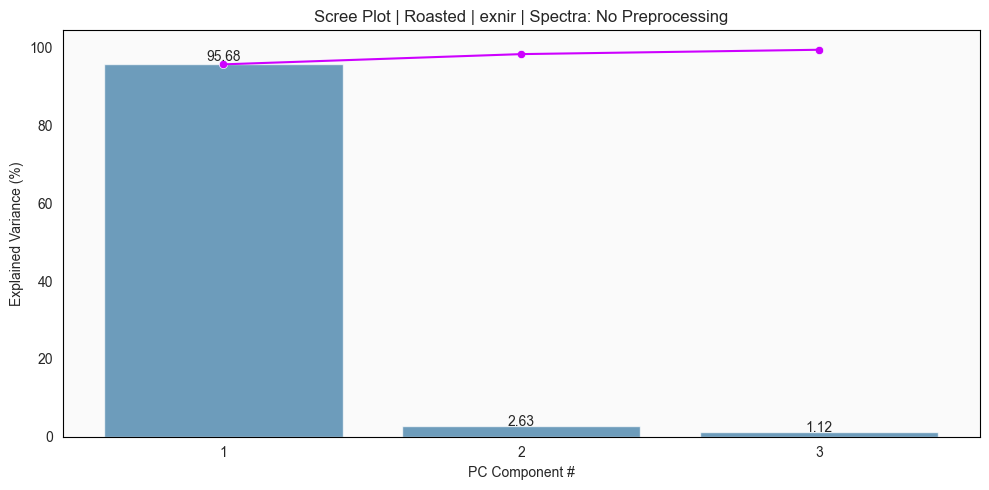

In [156]:
N_COMP = 0.99
RANDOM_STATE = 42
for spectrum in spectra:
    SAMPLE_TYPE = f'{label} | {spectrum}'
    plot_df = spectra_meta[f'{spectrum}_plot_df']

    fitted_pc, pc_labels = fit_pca(plot_df, N_COMP, RANDOM_STATE)

    spectra_meta = {
            **spectra_meta,
            f'{spectrum}_fitted_pc' : fitted_pc,
            f'{spectrum}_pc_labels' : pc_labels,
            }

    fig2, ax2 = plot_loadings(plot_df, fitted_pc, pc_labels, 
                            spec_prep=PREPROCESSING, 
                            sample_type=SAMPLE_TYPE)
    fig1, ax1 = plot_scree(fitted_pc,
                        spec_prep=PREPROCESSING, 
                        sample_type=SAMPLE_TYPE)    

    print(f"""Total Explained Variance: {fitted_pc.explained_variance_ratio_.sum()*100:.3f}% 
    Number of Components: {len(fitted_pc.explained_variance_ratio_)}""")

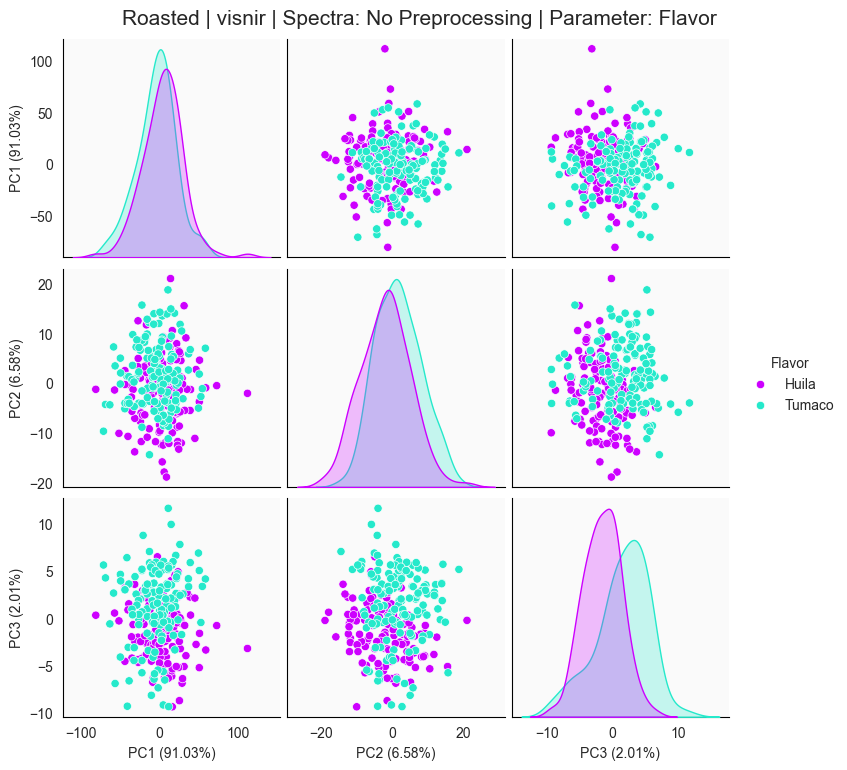

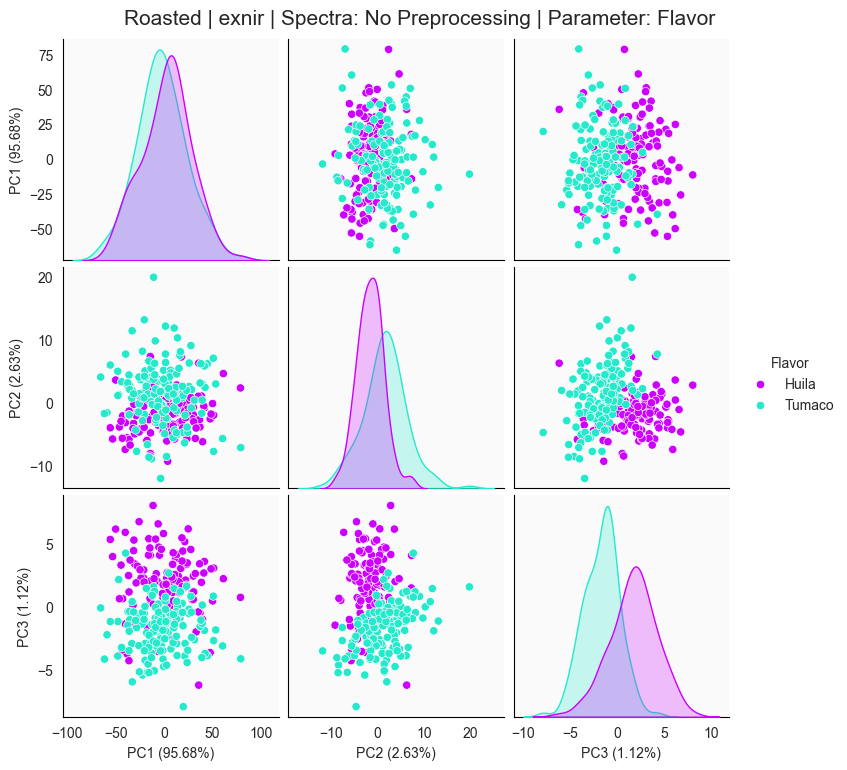

In [160]:
for spectrum in spectra:
    SAMPLE_TYPE = f'{label} | {spectrum}'
    
    plot_df = spectra_meta[f'{spectrum}_plot_df']
    fitted_pc = spectra_meta[f'{spectrum}_fitted_pc']
    pc_labels = spectra_meta[f'{spectrum}_pc_labels']

    for param in param_label_map.keys():
        pc_df = generate_pc_df(plot_df, fitted_pc, pc_labels, labels=label_df[[param]])
        sns.pairplot(data=pc_df.reset_index().drop('lot_id', axis=1), hue=param)
        plt.suptitle(f'{SAMPLE_TYPE} | Spectra: {PREPROCESSING} | Parameter: {param}', y=1.02, size=15)

In [ ]:
# fig = make_subplots(rows=3, cols= 2, 
#                     subplot_titles=['F Test Spectra', 'F Test PCA', 
#                                     'Mutual Info Spectra', 'Mutual Info PCA',
#                                     'Chi2 Spectra', 'Chi2 PCA'],
#                     specs=[[{'secondary_y': True}, {'secondary_y': True}],
#                            [{'secondary_y': False}, {'secondary_y': False}],
#                            [{'secondary_y': True}, {'secondary_y': True}]],
#                     horizontal_spacing=0.15,
#                     vertical_spacing=0.1)

# title = f'{SAMPLE_TYPE} | Spectra: {PREPROCESSING}'
# colors = px.colors.qualitative.Plotly
# pc_df = generate_pc_df(plot_df, fitted_pc, pc_labels, labels=label_df)
# n_comp = fitted_pc.n_components_

# for i, param in enumerate(param_label_map.keys()):
#     try:
#         f_reg_spec = f_classif(plot_df, label_df[param].values.ravel())
#         f_reg_pca = f_classif(pc_df.iloc[:, :n_comp], pc_df[param].values.ravel())
#         mms = MinMaxScaler()
#         scaled_spec = mms.fit_transform(plot_df)
#         scaled_pca = mms.fit_transform(pc_df.iloc[:, :n_comp])
#         mi_spec = mutual_info_classif(scaled_spec, label_df[param].values.ravel())
#         mi_pca = mutual_info_classif(scaled_pca, pc_df[param].values.ravel())
#         chi2_spec = chi2(scaled_spec, label_df[param].values.ravel())
#         chi2_pca = chi2(scaled_pca, pc_df[param].values.ravel())
        
#         fig.add_trace(
#             go.Scatter(x=plot_df.columns, y=f_reg_spec[0], marker_color=colors[i], name=param,
#                        opacity=0.5, showlegend=False),
#                        secondary_y=False,row=1, col=1)

#         fig.add_trace(
#             go.Scatter(x=plot_df.columns, y=f_reg_spec[1], name=param, marker_color=colors[i]),
#                     secondary_y=True, row=1, col=1)
        
#         fig.add_trace(
#             go.Scatter(x=pc_df.columns[:n_comp], y=f_reg_pca[0], marker_color=colors[i], name=param,
#                        opacity=0.5, showlegend=False),
#                        secondary_y=False,row=1, col=2)

#         fig.add_trace(
#             go.Scatter(x=pc_df.columns[:n_comp], y=f_reg_pca[1], showlegend=False,
#                        name=param, marker_color=colors[i]),
#                     secondary_y=True, row=1, col=2)
        
#         fig.add_trace(
#             go.Scatter(x=plot_df.columns, y=mi_spec, marker_color=colors[i], name=param,
#                        opacity=0.8, showlegend=False),
#                        secondary_y=False,row=2, col=1)

#         fig.add_trace(
#             go.Scatter(x=pc_df.columns[:n_comp], y=mi_pca, name=param, marker_color=colors[i],
#                        showlegend=False, opacity=0.8),
#                     secondary_y=False, row=2, col=2)
        
#         fig.add_trace(
#             go.Scatter(x=plot_df.columns, y=chi2_spec[0], marker_color=colors[i], name=param,
#                        opacity=0.5, showlegend=False),
#                        secondary_y=False,row=3, col=1)

#         fig.add_trace(
#             go.Scatter(x=plot_df.columns, y=chi2_spec[1], name=param, marker_color=colors[i]),
#                     secondary_y=True, row=3, col=1)
        
#         fig.add_trace(
#             go.Scatter(x=pc_df.columns[:n_comp], y=chi2_pca[0], marker_color=colors[i], name=param,
#                        opacity=0.5, showlegend=False),
#                        secondary_y=False,row=3, col=2)

#         fig.add_trace(
#             go.Scatter(x=pc_df.columns[:n_comp], y=chi2_pca[1], showlegend=False,
#                        name=param, marker_color=colors[i]),
#                     secondary_y=True, row=3, col=2)
        
#     except:
#         pass

# # Add figure title
# fig.update_layout(title_text=title, height=1400, width=1400)
# fig.update_xaxes(title_text="Wavelengths (nm)", col=1)
# fig.update_xaxes(title_text="No. of PCs", col=2)

# # Set y-axes titles
# fig.update_yaxes(title_text="F value", secondary_y=False, row=1)
# fig.update_yaxes(title_text="p value", secondary_y=True, row=1)
# fig.update_yaxes(title_text="Mutual Information", secondary_y=False, row=2)
# fig.update_yaxes(title_text="Chi2", secondary_y=False, row=3)
# fig.update_yaxes(title_text="p value", secondary_y=True, row=3)

# fig.show()

# SNV

In [161]:
spectra_meta = {}

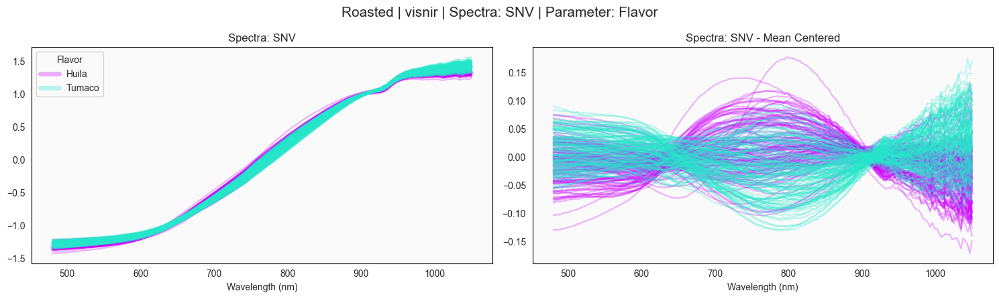

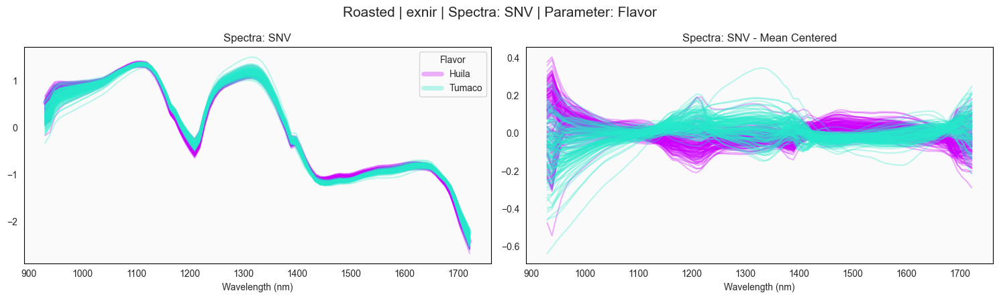

In [162]:
for spectrum in spectra:
    SAMPLE_TYPE = f'{label} | {spectrum}'
    raw_df = spectra[spectrum]

    # CONFIGS
    snv_df = pd.DataFrame(SNV().fit_transform(raw_df), columns=raw_df.columns, index=raw_df.index)
    plot_df = snv_df.copy()
    PREPROCESSING = 'SNV'

    spectra_meta = {
        **spectra_meta,
        f'{spectrum}_plot_df' : plot_df
    }

    for param, label_type in param_label_map.items():
        plot_spectra(plot_df, labels=label_df[[param]],
                    label_type=label_type,
                    spec_prep=PREPROCESSING,
                    sample_type=SAMPLE_TYPE,
                    cmap=cmap)

Total Explained Variance: 99.304% 
    Number of Components: 4
Total Explained Variance: 99.093% 
    Number of Components: 6


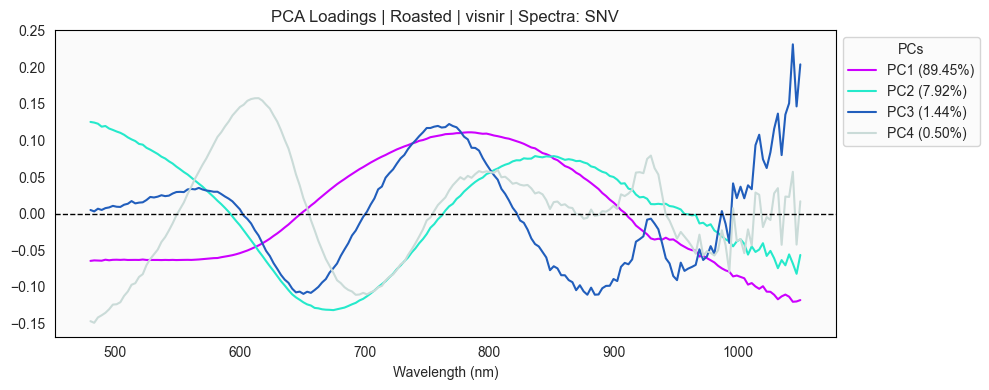

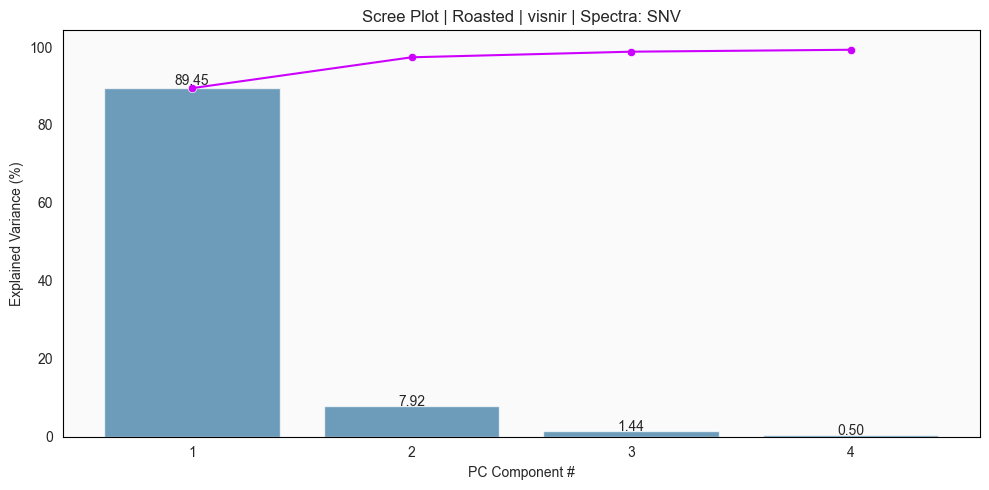

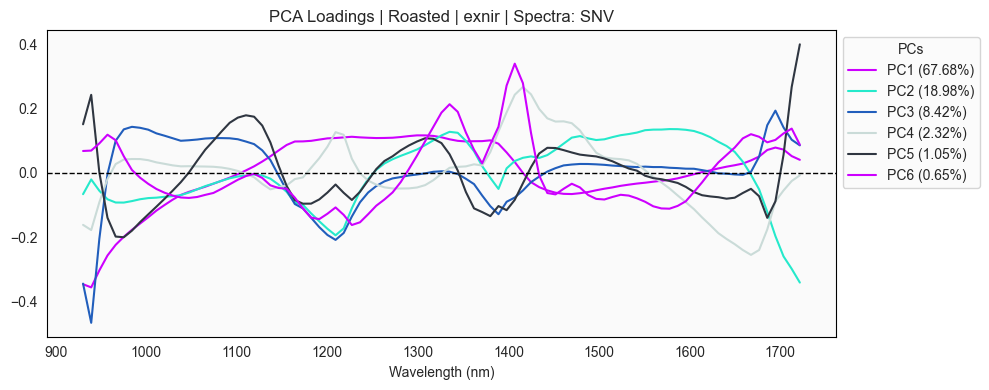

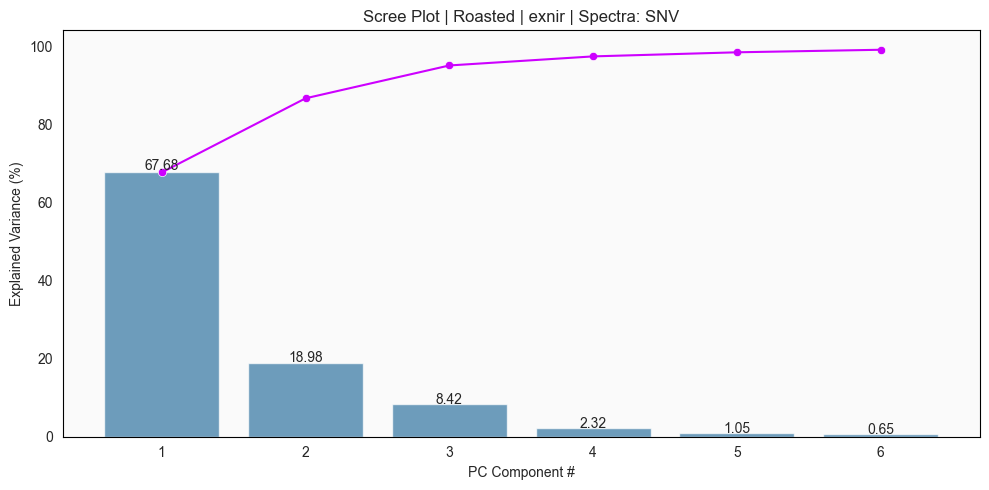

In [163]:
N_COMP = 0.99
RANDOM_STATE = 42

for spectrum in spectra:
    SAMPLE_TYPE = f'{label} | {spectrum}'
    plot_df = spectra_meta[f'{spectrum}_plot_df']

    fitted_pc, pc_labels = fit_pca(plot_df, N_COMP, RANDOM_STATE)

    spectra_meta = {
    **spectra_meta,
    f'{spectrum}_fitted_pc' : fitted_pc,
    f'{spectrum}_pc_labels' : pc_labels,
    }

    fig2, ax2 = plot_loadings(plot_df, fitted_pc, pc_labels, 
                            spec_prep=PREPROCESSING, 
                            sample_type=SAMPLE_TYPE)
    fig1, ax1 = plot_scree(fitted_pc,
                        spec_prep=PREPROCESSING, 
                        sample_type=SAMPLE_TYPE)
    print(f"""Total Explained Variance: {fitted_pc.explained_variance_ratio_.sum()*100:.3f}% 
    Number of Components: {len(fitted_pc.explained_variance_ratio_)}""")

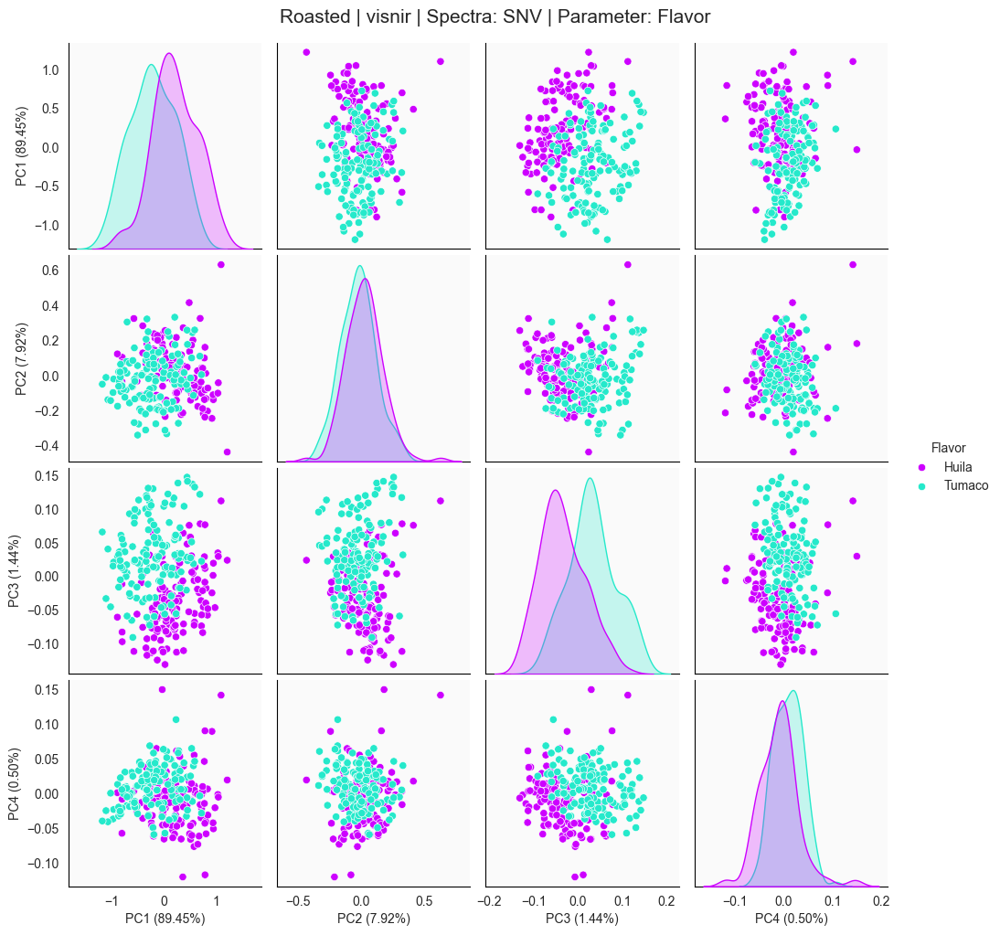

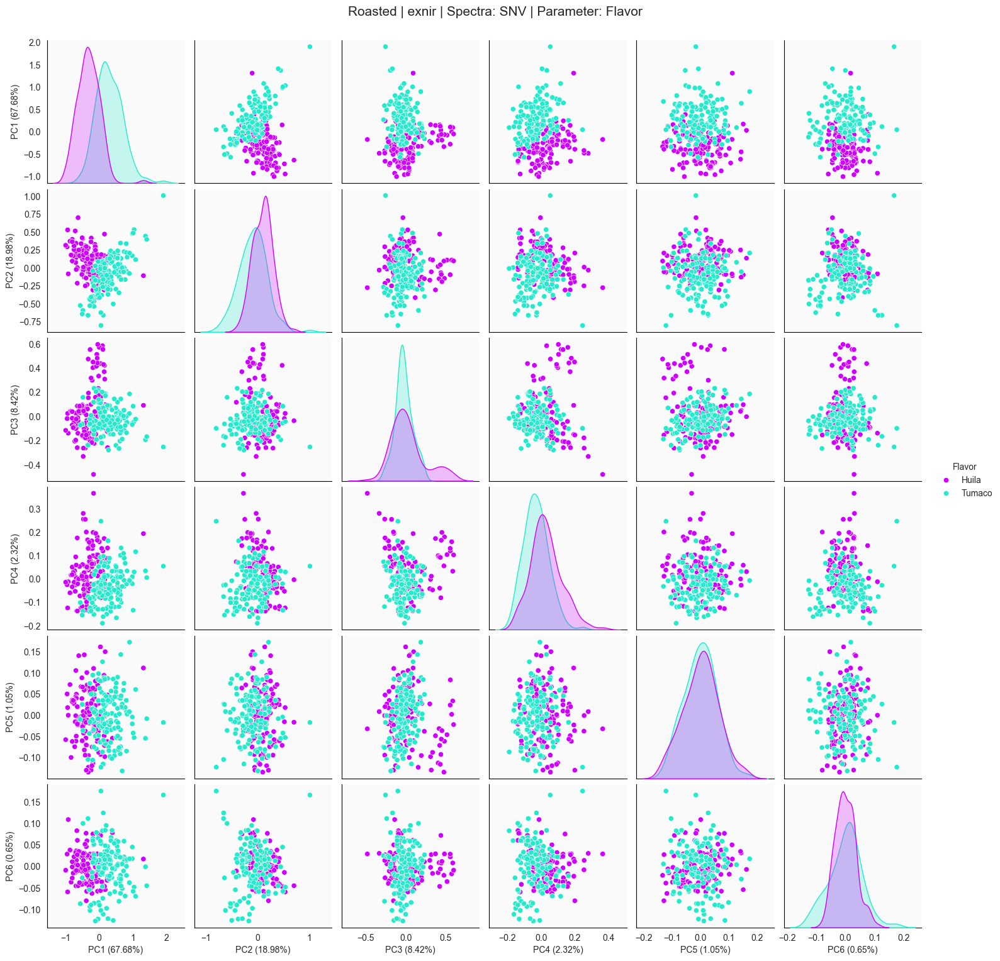

In [165]:
for spectrum in spectra:
    SAMPLE_TYPE = f'{label} | {spectrum}'
    plot_df = spectra_meta[f'{spectrum}_plot_df']
    fitted_pc = spectra_meta[f'{spectrum}_fitted_pc']
    pc_labels = spectra_meta[f'{spectrum}_pc_labels']

    for param in param_label_map.keys():
        pc_df = generate_pc_df(plot_df, fitted_pc, pc_labels, labels=label_df[[param]])
        sns.pairplot(data=pc_df.reset_index().drop('lot_id', axis=1), hue=param)
        plt.suptitle(f'{SAMPLE_TYPE} | Spectra: {PREPROCESSING} | Parameter: {param}', y=1.02, size=15)

In [166]:
# from adjustText import adjust_text

# N_COMP = 0.96
# RANDOM_STATE = 42

# fitted_pc, pc_labels = fit_pca(plot_df, N_COMP, RANDOM_STATE)

# for param in param_label_map.keys():
#     pc_df = generate_pc_df(plot_df, fitted_pc, pc_labels, labels=label_df[[param]])
#     g = sns.pairplot(data=pc_df.reset_index().drop('lot_id', axis=1), hue=param, height=5)

#     # Set to track which indices have been labeled
#     labeled_indices = set()
#     label_all = 'yes'

#     # Add data labels (annotations)
#     for i, j in zip(*np.tril_indices_from(g.axes, -1)):  # Iterate over the lower triangular part of the plot matrix
#         ax = g.axes[i, j]  # Access each subplot
#         xlabel = g.x_vars[j]  # Get the variable name for the x-axis
#         ylabel = g.y_vars[i]  # Get the variable name for the y-axis
        
#         for k in range(pc_df.shape[0]):  # Iterate through the rows of the dataframe
#             index_label = pc_df.index[k]  # Get the index label
#             if label_all == 'yes' and index_label in (80079,80069,80059,80061): #80064,80060
#                 ax.annotate(index_label, (pc_df.iloc[k][xlabel], pc_df.iloc[k][ylabel]), fontsize=7, ha='left')
#             # else:
#             #     if index_label not in labeled_indices:  # Check if the index has already been labeled
#             #         ax.annotate(index_label, (pc_df.iloc[k][xlabel], pc_df.iloc[k][ylabel]), fontsize=8, ha='left')
#             #         labeled_indices.add(index_label)  # Mark this index as labeled            

#     plt.suptitle(f'{SAMPLE_TYPE} | Spectra: {PREPROCESSING} | Parameter: {param}', y=1.02, size=15)
#     plt.show()

In [167]:
# fig = make_subplots(rows=3, cols= 2, 
#                     subplot_titles=['F Test Spectra', 'F Test PCA', 
#                                     'Mutual Info Spectra', 'Mutual Info PCA',
#                                     'Chi2 Spectra', 'Chi2 PCA'],
#                     specs=[[{'secondary_y': True}, {'secondary_y': True}],
#                            [{'secondary_y': False}, {'secondary_y': False}],
#                            [{'secondary_y': True}, {'secondary_y': True}]],
#                     horizontal_spacing=0.15,
#                     vertical_spacing=0.1)

# title = f'{SAMPLE_TYPE} | Spectra: {PREPROCESSING}'
# colors = px.colors.qualitative.Plotly
# pc_df = generate_pc_df(plot_df, fitted_pc, pc_labels, labels=label_df)
# n_comp = fitted_pc.n_components_

# for i, param in enumerate(param_label_map.keys()):
#     try:
#         f_reg_spec = f_classif(plot_df, label_df[param].values.ravel())
#         f_reg_pca = f_classif(pc_df.iloc[:, :n_comp], pc_df[param].values.ravel())
#         mms = MinMaxScaler()
#         scaled_spec = mms.fit_transform(plot_df)
#         scaled_pca = mms.fit_transform(pc_df.iloc[:, :n_comp])
#         mi_spec = mutual_info_classif(scaled_spec, label_df[param].values.ravel())
#         mi_pca = mutual_info_classif(scaled_pca, pc_df[param].values.ravel())
#         chi2_spec = chi2(scaled_spec, label_df[param].values.ravel())
#         chi2_pca = chi2(scaled_pca, pc_df[param].values.ravel())
        
#         fig.add_trace(
#             go.Scatter(x=plot_df.columns, y=f_reg_spec[0], marker_color=colors[i], name=param,
#                        opacity=0.5, showlegend=False),
#                        secondary_y=False,row=1, col=1)

#         fig.add_trace(
#             go.Scatter(x=plot_df.columns, y=f_reg_spec[1], name=param, marker_color=colors[i]),
#                     secondary_y=True, row=1, col=1)
        
#         fig.add_trace(
#             go.Scatter(x=pc_df.columns[:n_comp], y=f_reg_pca[0], marker_color=colors[i], name=param,
#                        opacity=0.5, showlegend=False),
#                        secondary_y=False,row=1, col=2)

#         fig.add_trace(
#             go.Scatter(x=pc_df.columns[:n_comp], y=f_reg_pca[1], showlegend=False,
#                        name=param, marker_color=colors[i]),
#                     secondary_y=True, row=1, col=2)
        
#         fig.add_trace(
#             go.Scatter(x=plot_df.columns, y=mi_spec, marker_color=colors[i], name=param,
#                        opacity=0.8, showlegend=False),
#                        secondary_y=False,row=2, col=1)

#         fig.add_trace(
#             go.Scatter(x=pc_df.columns[:n_comp], y=mi_pca, name=param, marker_color=colors[i],
#                        showlegend=False, opacity=0.8),
#                     secondary_y=False, row=2, col=2)
        
#         fig.add_trace(
#             go.Scatter(x=plot_df.columns, y=chi2_spec[0], marker_color=colors[i], name=param,
#                        opacity=0.5, showlegend=False),
#                        secondary_y=False,row=3, col=1)

#         fig.add_trace(
#             go.Scatter(x=plot_df.columns, y=chi2_spec[1], name=param, marker_color=colors[i]),
#                     secondary_y=True, row=3, col=1)
        
#         fig.add_trace(
#             go.Scatter(x=pc_df.columns[:n_comp], y=chi2_pca[0], marker_color=colors[i], name=param,
#                        opacity=0.5, showlegend=False),
#                        secondary_y=False,row=3, col=2)

#         fig.add_trace(
#             go.Scatter(x=pc_df.columns[:n_comp], y=chi2_pca[1], showlegend=False,
#                        name=param, marker_color=colors[i]),
#                     secondary_y=True, row=3, col=2)
        
#     except:
#         pass

# # Add figure title
# fig.update_layout(title_text=title, height=1400, width=1400)
# fig.update_xaxes(title_text="Wavelengths (nm)", col=1)
# fig.update_xaxes(title_text="No. of PCs", col=2)

# # Set y-axes titles
# fig.update_yaxes(title_text="F value", secondary_y=False, row=1)
# fig.update_yaxes(title_text="p value", secondary_y=True, row=1)
# fig.update_yaxes(title_text="Mutual Information", secondary_y=False, row=2)
# fig.update_yaxes(title_text="Chi2", secondary_y=False, row=3)
# fig.update_yaxes(title_text="p value", secondary_y=True, row=3)

# fig.show()

# Detrend

In [ ]:
# # CONFIGS
# msc = Detrend()
# msc_df = pd.DataFrame(msc.fit_transform(raw_df), columns=raw_df.columns, index=raw_df.index)
# plot_df = msc_df.copy()
# PREPROCESSING = 'Detrend'

In [ ]:
# for param, label_type in param_label_map.items():
#     plot_spectra(plot_df, labels=label_df[[param]],
#                  label_type=label_type,
#                  spec_prep=PREPROCESSING,
#                  sample_type=SAMPLE_TYPE,
#                  cmap=cmap)

In [ ]:
# N_COMP = 0.99
# RANDOM_STATE = 42

# fitted_pc, pc_labels = fit_pca(plot_df, N_COMP, RANDOM_STATE)
# fig2, ax2 = plot_loadings(plot_df, fitted_pc, pc_labels, 
#                           spec_prep=PREPROCESSING, 
#                           sample_type=SAMPLE_TYPE)
# fig1, ax1 = plot_scree(fitted_pc,
#                        spec_prep=PREPROCESSING, 
#                        sample_type=SAMPLE_TYPE)
# print(f"""Total Explained Variance: {fitted_pc.explained_variance_ratio_.sum()*100:.3f}% 
# Number of Components: {len(fitted_pc.explained_variance_ratio_)}""")

In [ ]:
# for param in param_label_map.keys():
#     pc_df = generate_pc_df(plot_df, fitted_pc, pc_labels, labels=label_df[[param]])
#     sns.pairplot(data=pc_df.reset_index().drop('lot_id', axis=1), hue=param)
#     plt.suptitle(f'{SAMPLE_TYPE} | Spectra: {PREPROCESSING} | Parameter: {param}', y=1.02, size=15)

In [ ]:
# fig = make_subplots(rows=3, cols= 2, 
#                     subplot_titles=['F Test Spectra', 'F Test PCA', 
#                                     'Mutual Info Spectra', 'Mutual Info PCA',
#                                     'Chi2 Spectra', 'Chi2 PCA'],
#                     specs=[[{'secondary_y': True}, {'secondary_y': True}],
#                            [{'secondary_y': False}, {'secondary_y': False}],
#                            [{'secondary_y': True}, {'secondary_y': True}]],
#                     horizontal_spacing=0.15,
#                     vertical_spacing=0.1)

# title = f'{SAMPLE_TYPE} | Spectra: {PREPROCESSING}'
# colors = px.colors.qualitative.Plotly
# pc_df = generate_pc_df(plot_df, fitted_pc, pc_labels, labels=label_df)
# n_comp = fitted_pc.n_components_

# for i, param in enumerate(param_label_map.keys()):
#     try:
#         f_reg_spec = f_classif(plot_df, label_df[param].values.ravel())
#         f_reg_pca = f_classif(pc_df.iloc[:, :n_comp], pc_df[param].values.ravel())
#         mms = MinMaxScaler()
#         scaled_spec = mms.fit_transform(plot_df)
#         scaled_pca = mms.fit_transform(pc_df.iloc[:, :n_comp])
#         mi_spec = mutual_info_classif(scaled_spec, label_df[param].values.ravel())
#         mi_pca = mutual_info_classif(scaled_pca, pc_df[param].values.ravel())
#         chi2_spec = chi2(scaled_spec, label_df[param].values.ravel())
#         chi2_pca = chi2(scaled_pca, pc_df[param].values.ravel())
        
#         fig.add_trace(
#             go.Scatter(x=plot_df.columns, y=f_reg_spec[0], marker_color=colors[i], name=param,
#                        opacity=0.5, showlegend=False),
#                        secondary_y=False,row=1, col=1)

#         fig.add_trace(
#             go.Scatter(x=plot_df.columns, y=f_reg_spec[1], name=param, marker_color=colors[i]),
#                     secondary_y=True, row=1, col=1)
        
#         fig.add_trace(
#             go.Scatter(x=pc_df.columns[:n_comp], y=f_reg_pca[0], marker_color=colors[i], name=param,
#                        opacity=0.5, showlegend=False),
#                        secondary_y=False,row=1, col=2)

#         fig.add_trace(
#             go.Scatter(x=pc_df.columns[:n_comp], y=f_reg_pca[1], showlegend=False,
#                        name=param, marker_color=colors[i]),
#                     secondary_y=True, row=1, col=2)
        
#         fig.add_trace(
#             go.Scatter(x=plot_df.columns, y=mi_spec, marker_color=colors[i], name=param,
#                        opacity=0.8, showlegend=False),
#                        secondary_y=False,row=2, col=1)

#         fig.add_trace(
#             go.Scatter(x=pc_df.columns[:n_comp], y=mi_pca, name=param, marker_color=colors[i],
#                        showlegend=False, opacity=0.8),
#                     secondary_y=False, row=2, col=2)
        
#         fig.add_trace(
#             go.Scatter(x=plot_df.columns, y=chi2_spec[0], marker_color=colors[i], name=param,
#                        opacity=0.5, showlegend=False),
#                        secondary_y=False,row=3, col=1)

#         fig.add_trace(
#             go.Scatter(x=plot_df.columns, y=chi2_spec[1], name=param, marker_color=colors[i]),
#                     secondary_y=True, row=3, col=1)
        
#         fig.add_trace(
#             go.Scatter(x=pc_df.columns[:n_comp], y=chi2_pca[0], marker_color=colors[i], name=param,
#                        opacity=0.5, showlegend=False),
#                        secondary_y=False,row=3, col=2)

#         fig.add_trace(
#             go.Scatter(x=pc_df.columns[:n_comp], y=chi2_pca[1], showlegend=False,
#                        name=param, marker_color=colors[i]),
#                     secondary_y=True, row=3, col=2)
        
#     except:
#         pass

# # Add figure title
# fig.update_layout(title_text=title, height=1400, width=1400)
# fig.update_xaxes(title_text="Wavelengths (nm)", col=1)
# fig.update_xaxes(title_text="No. of PCs", col=2)

# # Set y-axes titles
# fig.update_yaxes(title_text="F value", secondary_y=False, row=1)
# fig.update_yaxes(title_text="p value", secondary_y=True, row=1)
# fig.update_yaxes(title_text="Mutual Information", secondary_y=False, row=2)
# fig.update_yaxes(title_text="Chi2", secondary_y=False, row=3)
# fig.update_yaxes(title_text="p value", secondary_y=True, row=3)

# fig.show()

# SNV-Detrend

In [ ]:
# # CONFIGS
# snv_df = pd.DataFrame(Detrend().fit_transform(SNV().fit_transform(raw_df)), columns=raw_df.columns, index=raw_df.index)
# plot_df = snv_df.copy()
# PREPROCESSING = 'SNV-Detrend'

In [ ]:
# for param, label_type in param_label_map.items():
#     plot_spectra(plot_df, labels=label_df[[param]],
#                  label_type=label_type,
#                  spec_prep=PREPROCESSING,
#                  sample_type=SAMPLE_TYPE,
#                  cmap=cmap)

In [ ]:
# N_COMP = 0.99
# RANDOM_STATE = 42

# fitted_pc, pc_labels = fit_pca(plot_df, N_COMP, RANDOM_STATE)
# fig2, ax2 = plot_loadings(plot_df, fitted_pc, pc_labels, 
#                           spec_prep=PREPROCESSING, 
#                           sample_type=SAMPLE_TYPE)
# fig1, ax1 = plot_scree(fitted_pc,
#                        spec_prep=PREPROCESSING, 
#                        sample_type=SAMPLE_TYPE)
# print(f"""Total Explained Variance: {fitted_pc.explained_variance_ratio_.sum()*100:.3f}% 
# Number of Components: {len(fitted_pc.explained_variance_ratio_)}""")

In [ ]:
# for param in param_label_map.keys():
#     pc_df = generate_pc_df(plot_df, fitted_pc, pc_labels, labels=label_df[[param]])
#     sns.pairplot(data=pc_df.reset_index().drop('lot_id', axis=1), hue=param)
#     plt.suptitle(f'{SAMPLE_TYPE} | Spectra: {PREPROCESSING} | Parameter: {param}', y=1.02, size=15)

In [ ]:
# fig = make_subplots(rows=3, cols= 2, 
#                     subplot_titles=['F Test Spectra', 'F Test PCA', 
#                                     'Mutual Info Spectra', 'Mutual Info PCA',
#                                     'Chi2 Spectra', 'Chi2 PCA'],
#                     specs=[[{'secondary_y': True}, {'secondary_y': True}],
#                            [{'secondary_y': False}, {'secondary_y': False}],
#                            [{'secondary_y': True}, {'secondary_y': True}]],
#                     horizontal_spacing=0.15,
#                     vertical_spacing=0.1)

# title = f'{SAMPLE_TYPE} | Spectra: {PREPROCESSING}'
# colors = px.colors.qualitative.Plotly
# pc_df = generate_pc_df(plot_df, fitted_pc, pc_labels, labels=label_df)
# n_comp = fitted_pc.n_components_

# for i, param in enumerate(param_label_map.keys()):
#     try:
#         f_reg_spec = f_classif(plot_df, label_df[param].values.ravel())
#         f_reg_pca = f_classif(pc_df.iloc[:, :n_comp], pc_df[param].values.ravel())
#         mms = MinMaxScaler()
#         scaled_spec = mms.fit_transform(plot_df)
#         scaled_pca = mms.fit_transform(pc_df.iloc[:, :n_comp])
#         mi_spec = mutual_info_classif(scaled_spec, label_df[param].values.ravel())
#         mi_pca = mutual_info_classif(scaled_pca, pc_df[param].values.ravel())
#         chi2_spec = chi2(scaled_spec, label_df[param].values.ravel())
#         chi2_pca = chi2(scaled_pca, pc_df[param].values.ravel())
        
#         fig.add_trace(
#             go.Scatter(x=plot_df.columns, y=f_reg_spec[0], marker_color=colors[i], name=param,
#                        opacity=0.5, showlegend=False),
#                        secondary_y=False,row=1, col=1)

#         fig.add_trace(
#             go.Scatter(x=plot_df.columns, y=f_reg_spec[1], name=param, marker_color=colors[i]),
#                     secondary_y=True, row=1, col=1)
        
#         fig.add_trace(
#             go.Scatter(x=pc_df.columns[:n_comp], y=f_reg_pca[0], marker_color=colors[i], name=param,
#                        opacity=0.5, showlegend=False),
#                        secondary_y=False,row=1, col=2)

#         fig.add_trace(
#             go.Scatter(x=pc_df.columns[:n_comp], y=f_reg_pca[1], showlegend=False,
#                        name=param, marker_color=colors[i]),
#                     secondary_y=True, row=1, col=2)
        
#         fig.add_trace(
#             go.Scatter(x=plot_df.columns, y=mi_spec, marker_color=colors[i], name=param,
#                        opacity=0.8, showlegend=False),
#                        secondary_y=False,row=2, col=1)

#         fig.add_trace(
#             go.Scatter(x=pc_df.columns[:n_comp], y=mi_pca, name=param, marker_color=colors[i],
#                        showlegend=False, opacity=0.8),
#                     secondary_y=False, row=2, col=2)
        
#         fig.add_trace(
#             go.Scatter(x=plot_df.columns, y=chi2_spec[0], marker_color=colors[i], name=param,
#                        opacity=0.5, showlegend=False),
#                        secondary_y=False,row=3, col=1)

#         fig.add_trace(
#             go.Scatter(x=plot_df.columns, y=chi2_spec[1], name=param, marker_color=colors[i]),
#                     secondary_y=True, row=3, col=1)
        
#         fig.add_trace(
#             go.Scatter(x=pc_df.columns[:n_comp], y=chi2_pca[0], marker_color=colors[i], name=param,
#                        opacity=0.5, showlegend=False),
#                        secondary_y=False,row=3, col=2)

#         fig.add_trace(
#             go.Scatter(x=pc_df.columns[:n_comp], y=chi2_pca[1], showlegend=False,
#                        name=param, marker_color=colors[i]),
#                     secondary_y=True, row=3, col=2)
        
#     except:
#         pass

# # Add figure title
# fig.update_layout(title_text=title, height=1400, width=1400)
# fig.update_xaxes(title_text="Wavelengths (nm)", col=1)
# fig.update_xaxes(title_text="No. of PCs", col=2)

# # Set y-axes titles
# fig.update_yaxes(title_text="F value", secondary_y=False, row=1)
# fig.update_yaxes(title_text="p value", secondary_y=True, row=1)
# fig.update_yaxes(title_text="Mutual Information", secondary_y=False, row=2)
# fig.update_yaxes(title_text="Chi2", secondary_y=False, row=3)
# fig.update_yaxes(title_text="p value", secondary_y=True, row=3)

# fig.show()

# SG1D9W2P

In [ ]:
spectra_meta = {}

In [ ]:
# CONFIGS
msc = SavitzkyGolay(deriv=1, window=9, polyorder=2)
PREPROCESSING = 'SG1D9W2P'

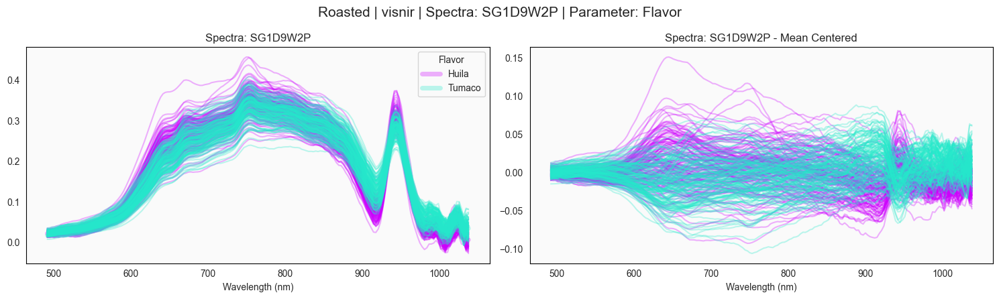

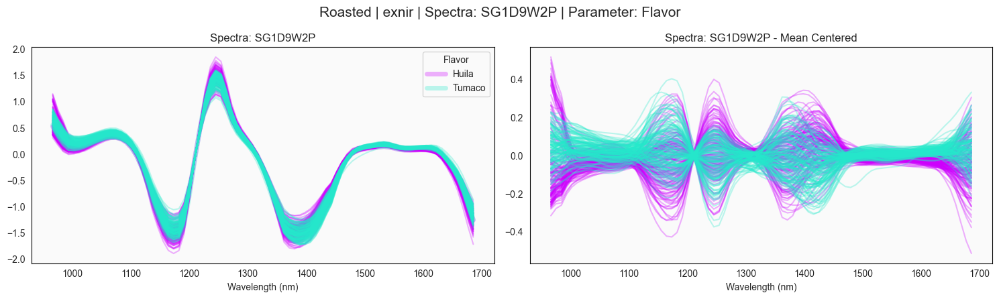

In [ ]:
for spectrum in spectra:
    SAMPLE_TYPE = f'{label} | {spectrum}'
    raw_df = spectra[spectrum]

    # CONFIGS
    msc_df = pd.DataFrame(msc.fit_transform(raw_df), 
                      columns=raw_df.columns[4:-4], index=raw_df.index)
    plot_df = msc_df.copy()

    spectra_meta = {
        **spectra_meta,
        f'{spectrum}_plot_df' : plot_df
    }

    for param, label_type in param_label_map.items():
        plot_spectra(plot_df, labels=label_df[[param]],
                    label_type=label_type,
                    spec_prep=PREPROCESSING,
                    sample_type=SAMPLE_TYPE,
                    cmap=cmap)

Total Explained Variance: 99.119% 
    Number of Components: 10
Total Explained Variance: 99.264% 
    Number of Components: 7


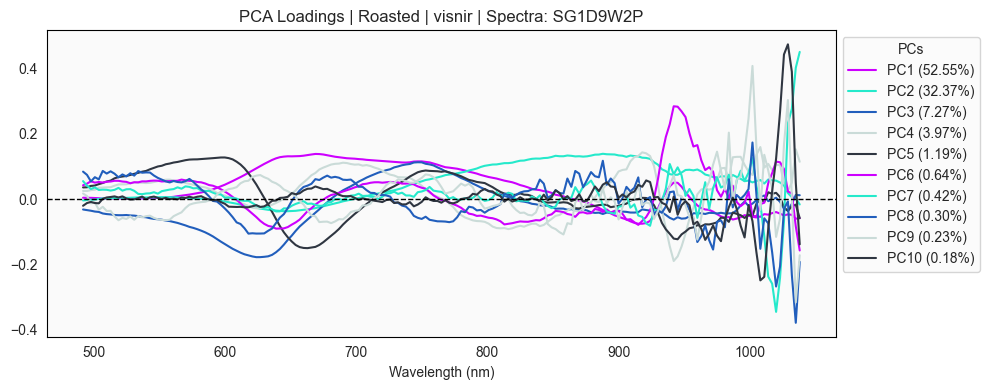

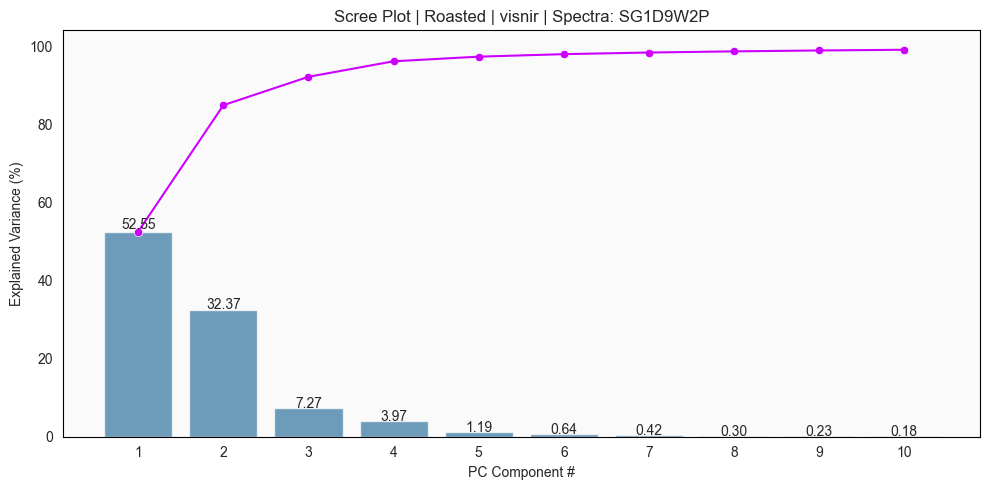

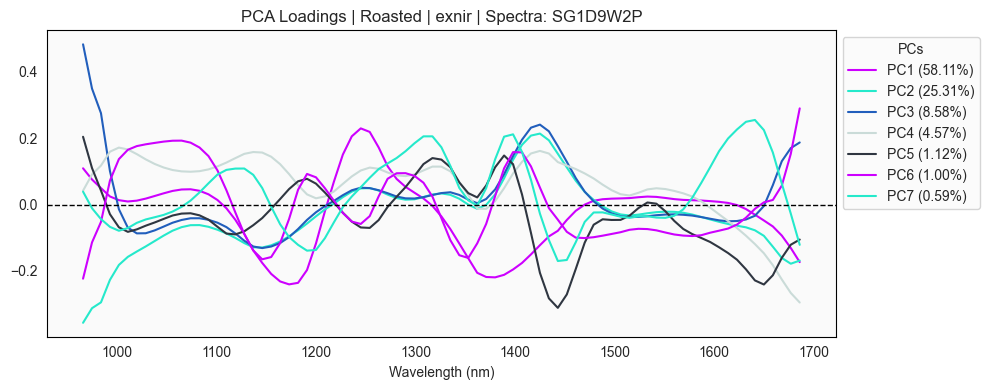

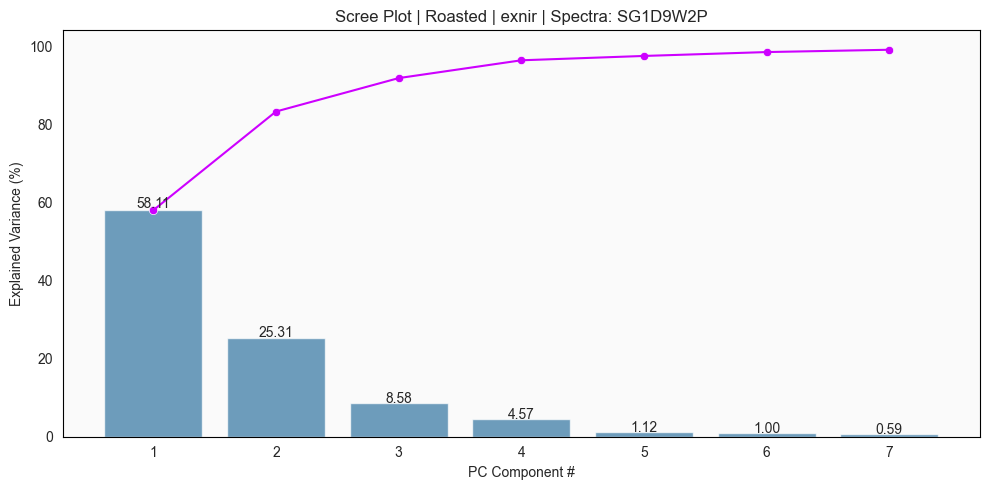

In [171]:
N_COMP = 0.99
RANDOM_STATE = 42

for spectrum in spectra:
    SAMPLE_TYPE = f'{label} | {spectrum}'
    plot_df = spectra_meta[f'{spectrum}_plot_df']

    fitted_pc, pc_labels = fit_pca(plot_df, N_COMP, RANDOM_STATE)

    spectra_meta = {
    **spectra_meta,
    f'{spectrum}_fitted_pc' : fitted_pc,
    f'{spectrum}_pc_labels' : pc_labels,
    }

    fig2, ax2 = plot_loadings(plot_df, fitted_pc, pc_labels, 
                            spec_prep=PREPROCESSING, 
                            sample_type=SAMPLE_TYPE)
    fig1, ax1 = plot_scree(fitted_pc,
                        spec_prep=PREPROCESSING, 
                        sample_type=SAMPLE_TYPE)
    print(f"""Total Explained Variance: {fitted_pc.explained_variance_ratio_.sum()*100:.3f}% 
    Number of Components: {len(fitted_pc.explained_variance_ratio_)}""")

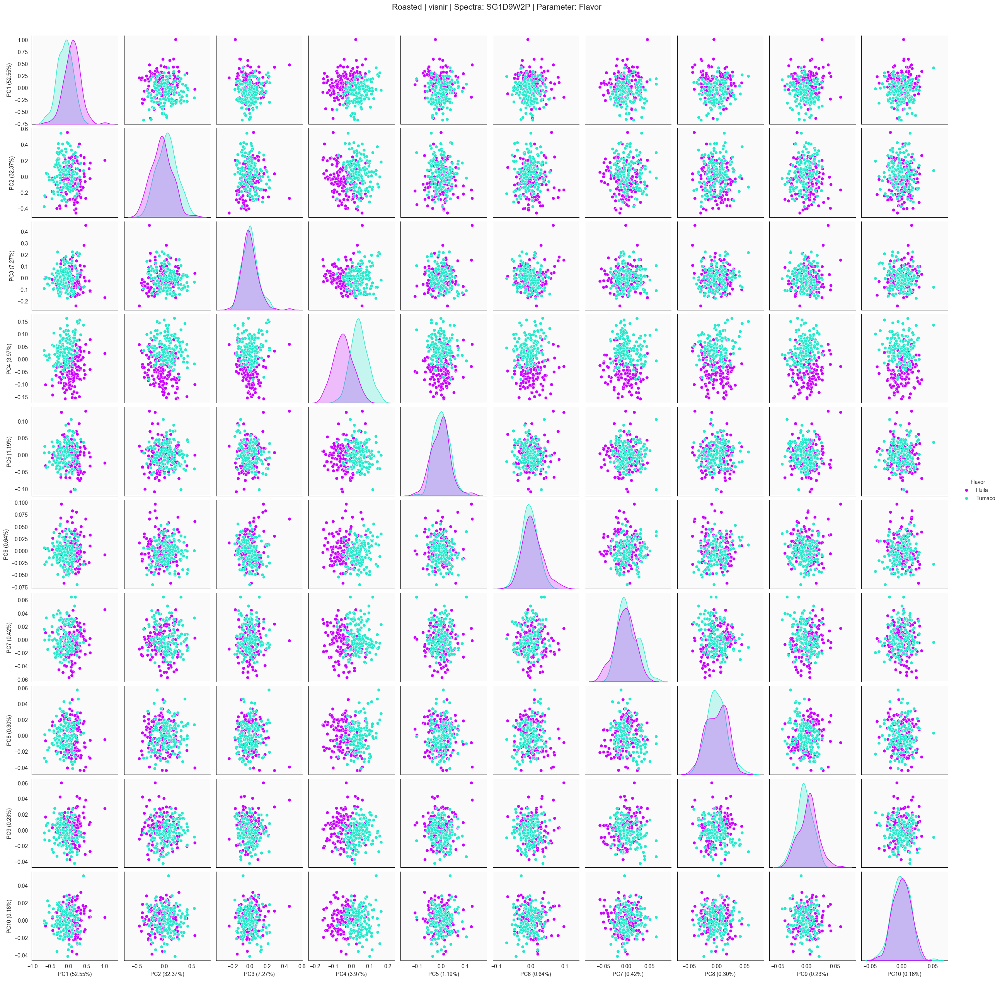

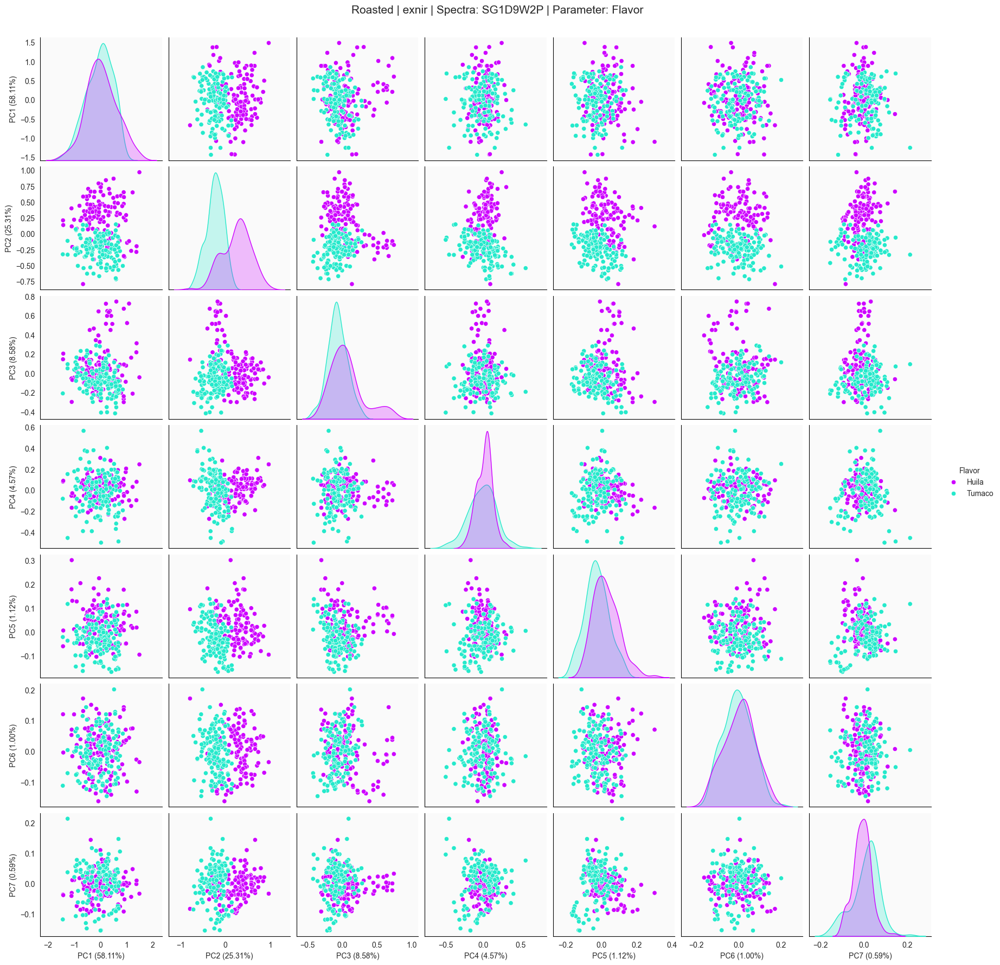

In [172]:
for spectrum in spectra:
    SAMPLE_TYPE = f'{label} | {spectrum}'
    plot_df = spectra_meta[f'{spectrum}_plot_df']
    fitted_pc = spectra_meta[f'{spectrum}_fitted_pc']
    pc_labels = spectra_meta[f'{spectrum}_pc_labels']

    for param in param_label_map.keys():
        pc_df = generate_pc_df(plot_df, fitted_pc, pc_labels, labels=label_df[[param]])
        sns.pairplot(data=pc_df.reset_index().drop('lot_id', axis=1), hue=param)
        plt.suptitle(f'{SAMPLE_TYPE} | Spectra: {PREPROCESSING} | Parameter: {param}', y=1.02, size=15)

In [ ]:
# N_COMP = 0.93
# RANDOM_STATE = 42

# fitted_pc, pc_labels = fit_pca(plot_df, N_COMP, RANDOM_STATE)

# for param in param_label_map.keys():
#     pc_df = generate_pc_df(plot_df, fitted_pc, pc_labels, labels=label_df[[param]])
#     g = sns.pairplot(data=pc_df.reset_index().drop('lot_id', axis=1), hue=param, height=5)

#     # Set to track which indices have been labeled
#     labeled_indices = set()
#     label_all = 'yes'

#     # Add data labels (annotations)
#     for i, j in zip(*np.tril_indices_from(g.axes, -1)):  # Iterate over the lower triangular part of the plot matrix
#         ax = g.axes[i, j]  # Access each subplot
#         xlabel = g.x_vars[j]  # Get the variable name for the x-axis
#         ylabel = g.y_vars[i]  # Get the variable name for the y-axis
        
#         for k in range(pc_df.shape[0]):  # Iterate through the rows of the dataframe
#             index_label = pc_df.index[k]  # Get the index label
#             # if label_all == 'yes' and pc_df['type'].iloc[k] == 'VLSFO':
#             if label_all == 'yes' and index_label in (80079,80069,80059,80061): #80064,80060
#                 ax.annotate(index_label, (pc_df.iloc[k][xlabel], pc_df.iloc[k][ylabel]), fontsize=7, ha='left')
#             # else:
#                 if index_label not in labeled_indices:  # Check if the index has already been labeled
#                     ax.annotate(index_label, (pc_df.iloc[k][xlabel], pc_df.iloc[k][ylabel]), fontsize=8, ha='left')
#                     labeled_indices.add(index_label)  # Mark this index as labeled            

#     plt.suptitle(f'{SAMPLE_TYPE} | Spectra: {PREPROCESSING} | Parameter: {param}', y=1.02, size=15)
#     plt.show()

In [ ]:
# fig = make_subplots(rows=3, cols= 2, 
#                     subplot_titles=['F Test Spectra', 'F Test PCA', 
#                                     'Mutual Info Spectra', 'Mutual Info PCA',
#                                     'Chi2 Spectra', 'Chi2 PCA'],
#                     specs=[[{'secondary_y': True}, {'secondary_y': True}],
#                            [{'secondary_y': False}, {'secondary_y': False}],
#                            [{'secondary_y': True}, {'secondary_y': True}]],
#                     horizontal_spacing=0.15,
#                     vertical_spacing=0.1)

# title = f'{SAMPLE_TYPE} | Spectra: {PREPROCESSING}'
# colors = px.colors.qualitative.Plotly
# pc_df = generate_pc_df(plot_df, fitted_pc, pc_labels, labels=label_df)
# n_comp = fitted_pc.n_components_

# for i, param in enumerate(param_label_map.keys()):
#     try:
#         f_reg_spec = f_classif(plot_df, label_df[param].values.ravel())
#         f_reg_pca = f_classif(pc_df.iloc[:, :n_comp], pc_df[param].values.ravel())
#         mms = MinMaxScaler()
#         scaled_spec = mms.fit_transform(plot_df)
#         scaled_pca = mms.fit_transform(pc_df.iloc[:, :n_comp])
#         mi_spec = mutual_info_classif(scaled_spec, label_df[param].values.ravel())
#         mi_pca = mutual_info_classif(scaled_pca, pc_df[param].values.ravel())
#         chi2_spec = chi2(scaled_spec, label_df[param].values.ravel())
#         chi2_pca = chi2(scaled_pca, pc_df[param].values.ravel())
        
#         fig.add_trace(
#             go.Scatter(x=plot_df.columns, y=f_reg_spec[0], marker_color=colors[i], name=param,
#                        opacity=0.5, showlegend=False),
#                        secondary_y=False,row=1, col=1)

#         fig.add_trace(
#             go.Scatter(x=plot_df.columns, y=f_reg_spec[1], name=param, marker_color=colors[i]),
#                     secondary_y=True, row=1, col=1)
        
#         fig.add_trace(
#             go.Scatter(x=pc_df.columns[:n_comp], y=f_reg_pca[0], marker_color=colors[i], name=param,
#                        opacity=0.5, showlegend=False),
#                        secondary_y=False,row=1, col=2)

#         fig.add_trace(
#             go.Scatter(x=pc_df.columns[:n_comp], y=f_reg_pca[1], showlegend=False,
#                        name=param, marker_color=colors[i]),
#                     secondary_y=True, row=1, col=2)
        
#         fig.add_trace(
#             go.Scatter(x=plot_df.columns, y=mi_spec, marker_color=colors[i], name=param,
#                        opacity=0.8, showlegend=False),
#                        secondary_y=False,row=2, col=1)

#         fig.add_trace(
#             go.Scatter(x=pc_df.columns[:n_comp], y=mi_pca, name=param, marker_color=colors[i],
#                        showlegend=False, opacity=0.8),
#                     secondary_y=False, row=2, col=2)
        
#         fig.add_trace(
#             go.Scatter(x=plot_df.columns, y=chi2_spec[0], marker_color=colors[i], name=param,
#                        opacity=0.5, showlegend=False),
#                        secondary_y=False,row=3, col=1)

#         fig.add_trace(
#             go.Scatter(x=plot_df.columns, y=chi2_spec[1], name=param, marker_color=colors[i]),
#                     secondary_y=True, row=3, col=1)
        
#         fig.add_trace(
#             go.Scatter(x=pc_df.columns[:n_comp], y=chi2_pca[0], marker_color=colors[i], name=param,
#                        opacity=0.5, showlegend=False),
#                        secondary_y=False,row=3, col=2)

#         fig.add_trace(
#             go.Scatter(x=pc_df.columns[:n_comp], y=chi2_pca[1], showlegend=False,
#                        name=param, marker_color=colors[i]),
#                     secondary_y=True, row=3, col=2)
        
#     except:
#         pass

# # Add figure title
# fig.update_layout(title_text=title, height=1400, width=1400)
# fig.update_xaxes(title_text="Wavelengths (nm)", col=1)
# fig.update_xaxes(title_text="No. of PCs", col=2)

# # Set y-axes titles
# fig.update_yaxes(title_text="F value", secondary_y=False, row=1)
# fig.update_yaxes(title_text="p value", secondary_y=True, row=1)
# fig.update_yaxes(title_text="Mutual Information", secondary_y=False, row=2)
# fig.update_yaxes(title_text="Chi2", secondary_y=False, row=3)
# fig.update_yaxes(title_text="p value", secondary_y=True, row=3)

# fig.show()

# SNV-SG1D9W2P

In [ ]:
# # CONFIGS
# msc = SavitzkyGolay(deriv=1, window=9, polyorder=2)
# msc_df = pd.DataFrame(msc.fit_transform(SNV().fit_transform(raw_df)), 
#                       columns=raw_df.columns[4:-4], index=raw_df.index)
# plot_df = msc_df.copy()
# PREPROCESSING = 'SNV-SG1D4W2P'

In [ ]:
# for param, label_type in param_label_map.items():
#     plot_spectra(plot_df, labels=label_df[[param]],
#                  label_type=label_type,
#                  spec_prep=PREPROCESSING,
#                  sample_type=SAMPLE_TYPE,
#                  cmap=cmap)

In [ ]:
# N_COMP = 0.95
# RANDOM_STATE = 42

# fitted_pc, pc_labels = fit_pca(plot_df, N_COMP, RANDOM_STATE)
# fig2, ax2 = plot_loadings(plot_df, fitted_pc, pc_labels, 
#                           spec_prep=PREPROCESSING, 
#                           sample_type=SAMPLE_TYPE)
# fig1, ax1 = plot_scree(fitted_pc,
#                        spec_prep=PREPROCESSING, 
#                        sample_type=SAMPLE_TYPE)
# print(f"""Total Explained Variance: {fitted_pc.explained_variance_ratio_.sum()*100:.3f}% 
# Number of Components: {len(fitted_pc.explained_variance_ratio_)}""")

In [ ]:
# for param in param_label_map.keys():
#     pc_df = generate_pc_df(plot_df, fitted_pc, pc_labels, labels=label_df[[param]])
#     sns.pairplot(data=pc_df.reset_index().drop('lot_id', axis=1), hue=param)
#     plt.suptitle(f'{SAMPLE_TYPE} | Spectra: {PREPROCESSING} | Parameter: {param}', y=1.02, size=15)

In [ ]:
# fig = make_subplots(rows=3, cols= 2, 
#                     subplot_titles=['F Test Spectra', 'F Test PCA', 
#                                     'Mutual Info Spectra', 'Mutual Info PCA',
#                                     'Chi2 Spectra', 'Chi2 PCA'],
#                     specs=[[{'secondary_y': True}, {'secondary_y': True}],
#                            [{'secondary_y': False}, {'secondary_y': False}],
#                            [{'secondary_y': True}, {'secondary_y': True}]],
#                     horizontal_spacing=0.15,
#                     vertical_spacing=0.1)

# title = f'{SAMPLE_TYPE} | Spectra: {PREPROCESSING}'
# colors = px.colors.qualitative.Plotly
# pc_df = generate_pc_df(plot_df, fitted_pc, pc_labels, labels=label_df)
# n_comp = fitted_pc.n_components_

# for i, param in enumerate(param_label_map.keys()):
#     try:
#         f_reg_spec = f_classif(plot_df, label_df[param].values.ravel())
#         f_reg_pca = f_classif(pc_df.iloc[:, :n_comp], pc_df[param].values.ravel())
#         mms = MinMaxScaler()
#         scaled_spec = mms.fit_transform(plot_df)
#         scaled_pca = mms.fit_transform(pc_df.iloc[:, :n_comp])
#         mi_spec = mutual_info_classif(scaled_spec, label_df[param].values.ravel())
#         mi_pca = mutual_info_classif(scaled_pca, pc_df[param].values.ravel())
#         chi2_spec = chi2(scaled_spec, label_df[param].values.ravel())
#         chi2_pca = chi2(scaled_pca, pc_df[param].values.ravel())
        
#         fig.add_trace(
#             go.Scatter(x=plot_df.columns, y=f_reg_spec[0], marker_color=colors[i], name=param,
#                        opacity=0.5, showlegend=False),
#                        secondary_y=False,row=1, col=1)

#         fig.add_trace(
#             go.Scatter(x=plot_df.columns, y=f_reg_spec[1], name=param, marker_color=colors[i]),
#                     secondary_y=True, row=1, col=1)
        
#         fig.add_trace(
#             go.Scatter(x=pc_df.columns[:n_comp], y=f_reg_pca[0], marker_color=colors[i], name=param,
#                        opacity=0.5, showlegend=False),
#                        secondary_y=False,row=1, col=2)

#         fig.add_trace(
#             go.Scatter(x=pc_df.columns[:n_comp], y=f_reg_pca[1], showlegend=False,
#                        name=param, marker_color=colors[i]),
#                     secondary_y=True, row=1, col=2)
        
#         fig.add_trace(
#             go.Scatter(x=plot_df.columns, y=mi_spec, marker_color=colors[i], name=param,
#                        opacity=0.8, showlegend=False),
#                        secondary_y=False,row=2, col=1)

#         fig.add_trace(
#             go.Scatter(x=pc_df.columns[:n_comp], y=mi_pca, name=param, marker_color=colors[i],
#                        showlegend=False, opacity=0.8),
#                     secondary_y=False, row=2, col=2)
        
#         fig.add_trace(
#             go.Scatter(x=plot_df.columns, y=chi2_spec[0], marker_color=colors[i], name=param,
#                        opacity=0.5, showlegend=False),
#                        secondary_y=False,row=3, col=1)

#         fig.add_trace(
#             go.Scatter(x=plot_df.columns, y=chi2_spec[1], name=param, marker_color=colors[i]),
#                     secondary_y=True, row=3, col=1)
        
#         fig.add_trace(
#             go.Scatter(x=pc_df.columns[:n_comp], y=chi2_pca[0], marker_color=colors[i], name=param,
#                        opacity=0.5, showlegend=False),
#                        secondary_y=False,row=3, col=2)

#         fig.add_trace(
#             go.Scatter(x=pc_df.columns[:n_comp], y=chi2_pca[1], showlegend=False,
#                        name=param, marker_color=colors[i]),
#                     secondary_y=True, row=3, col=2)
        
#     except:
#         pass

# # Add figure title
# fig.update_layout(title_text=title, height=1400, width=1400)
# fig.update_xaxes(title_text="Wavelengths (nm)", col=1)
# fig.update_xaxes(title_text="No. of PCs", col=2)

# # Set y-axes titles
# fig.update_yaxes(title_text="F value", secondary_y=False, row=1)
# fig.update_yaxes(title_text="p value", secondary_y=True, row=1)
# fig.update_yaxes(title_text="Mutual Information", secondary_y=False, row=2)
# fig.update_yaxes(title_text="Chi2", secondary_y=False, row=3)
# fig.update_yaxes(title_text="p value", secondary_y=True, row=3)

# fig.show()

# SG2D9W2P

In [174]:
spectra_meta = {}

In [175]:
# CONFIGS
msc = SavitzkyGolay(deriv=2, window=9, polyorder=2)
PREPROCESSING = 'SG2D9W2P'

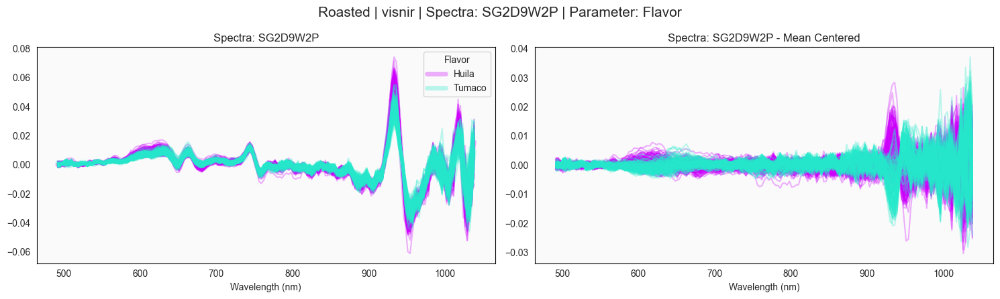

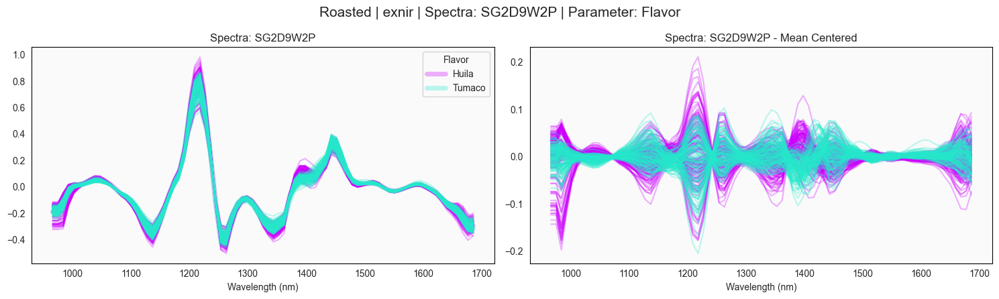

In [178]:
for spectrum in spectra:
    SAMPLE_TYPE = f'{label} | {spectrum}'
    raw_df = spectra[spectrum]

    # CONFIGS
    msc_df = pd.DataFrame(msc.fit_transform(raw_df), 
                      columns=raw_df.columns[4:-4], index=raw_df.index)
    plot_df = msc_df.copy()

    spectra_meta = {
        **spectra_meta,
        f'{spectrum}_plot_df' : plot_df
    }

    for param, label_type in param_label_map.items():
        plot_spectra(plot_df, labels=label_df[[param]],
                    label_type=label_type,
                    spec_prep=PREPROCESSING,
                    sample_type=SAMPLE_TYPE,
                    cmap=cmap)

Total Explained Variance: 99.027% 
    Number of Components: 58
Total Explained Variance: 99.220% 
    Number of Components: 8


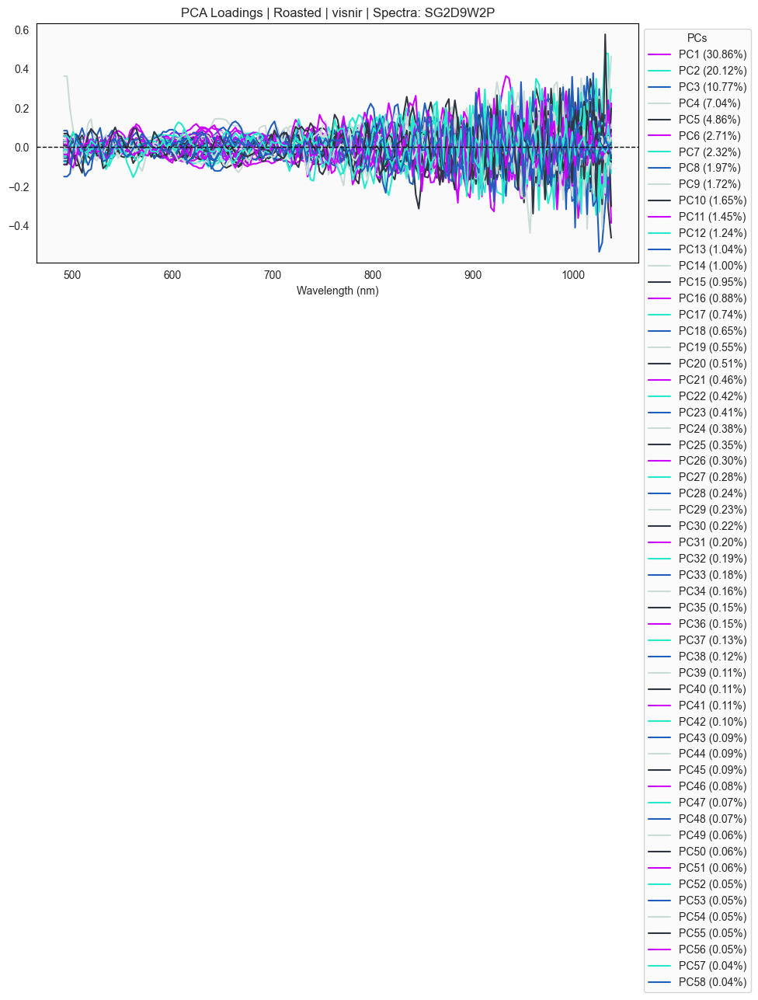

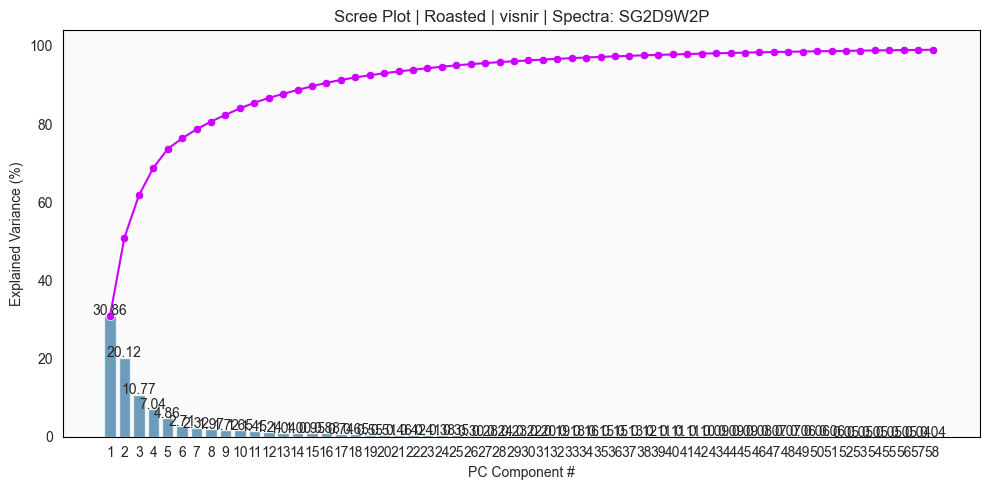

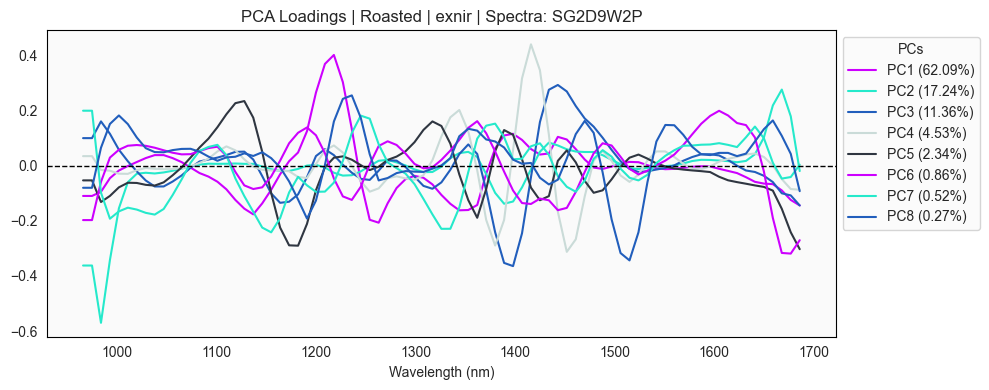

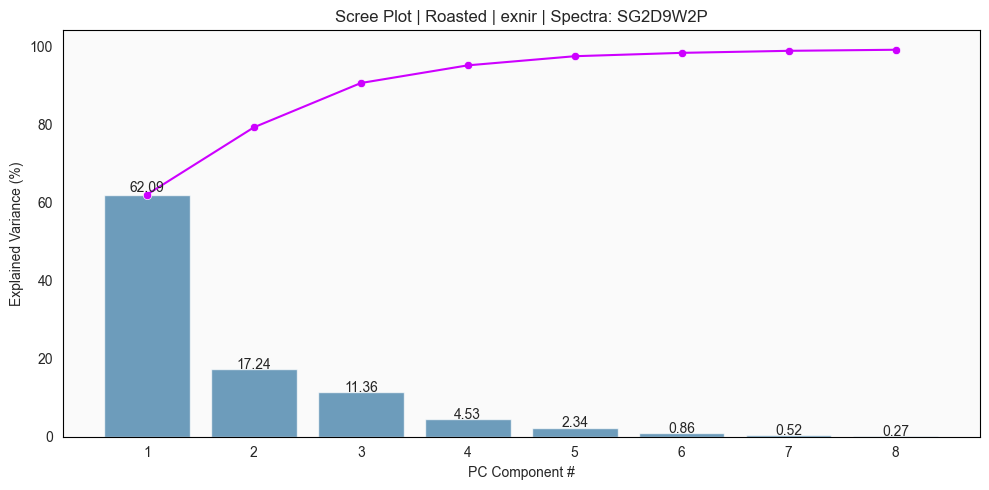

In [179]:
N_COMP = 0.99
RANDOM_STATE = 42

for spectrum in spectra:
    SAMPLE_TYPE = f'{label} | {spectrum}'
    plot_df = spectra_meta[f'{spectrum}_plot_df']

    fitted_pc, pc_labels = fit_pca(plot_df, N_COMP, RANDOM_STATE)

    spectra_meta = {
    **spectra_meta,
    f'{spectrum}_fitted_pc' : fitted_pc,
    f'{spectrum}_pc_labels' : pc_labels,
    }
    
    fig2, ax2 = plot_loadings(plot_df, fitted_pc, pc_labels, 
                            spec_prep=PREPROCESSING, 
                            sample_type=SAMPLE_TYPE)
    fig1, ax1 = plot_scree(fitted_pc,
                        spec_prep=PREPROCESSING, 
                        sample_type=SAMPLE_TYPE)
    print(f"""Total Explained Variance: {fitted_pc.explained_variance_ratio_.sum()*100:.3f}% 
    Number of Components: {len(fitted_pc.explained_variance_ratio_)}""")

In [ ]:
for spectrum in spectra:
    SAMPLE_TYPE = f'{label} | {spectrum}'
    plot_df = spectra_meta[f'{spectrum}_plot_df']
    fitted_pc = spectra_meta[f'{spectrum}_fitted_pc']
    pc_labels = spectra_meta[f'{spectrum}_pc_labels']
    
    for param in param_label_map.keys():
        pc_df = generate_pc_df(plot_df, fitted_pc, pc_labels, labels=label_df[[param]])
        sns.pairplot(data=pc_df.reset_index().drop('lot_id', axis=1), hue=param)
        plt.suptitle(f'{SAMPLE_TYPE} | Spectra: {PREPROCESSING} | Parameter: {param}', y=1.02, size=15)

In [ ]:
# fig = make_subplots(rows=3, cols= 2, 
#                     subplot_titles=['F Test Spectra', 'F Test PCA', 
#                                     'Mutual Info Spectra', 'Mutual Info PCA',
#                                     'Chi2 Spectra', 'Chi2 PCA'],
#                     specs=[[{'secondary_y': True}, {'secondary_y': True}],
#                            [{'secondary_y': False}, {'secondary_y': False}],
#                            [{'secondary_y': True}, {'secondary_y': True}]],
#                     horizontal_spacing=0.15,
#                     vertical_spacing=0.1)

# title = f'{SAMPLE_TYPE} | Spectra: {PREPROCESSING}'
# colors = px.colors.qualitative.Plotly
# pc_df = generate_pc_df(plot_df, fitted_pc, pc_labels, labels=label_df)
# n_comp = fitted_pc.n_components_

# for i, param in enumerate(param_label_map.keys()):
#     try:
#         f_reg_spec = f_classif(plot_df, label_df[param].values.ravel())
#         f_reg_pca = f_classif(pc_df.iloc[:, :n_comp], pc_df[param].values.ravel())
#         mms = MinMaxScaler()
#         scaled_spec = mms.fit_transform(plot_df)
#         scaled_pca = mms.fit_transform(pc_df.iloc[:, :n_comp])
#         mi_spec = mutual_info_classif(scaled_spec, label_df[param].values.ravel())
#         mi_pca = mutual_info_classif(scaled_pca, pc_df[param].values.ravel())
#         chi2_spec = chi2(scaled_spec, label_df[param].values.ravel())
#         chi2_pca = chi2(scaled_pca, pc_df[param].values.ravel())
        
#         fig.add_trace(
#             go.Scatter(x=plot_df.columns, y=f_reg_spec[0], marker_color=colors[i], name=param,
#                        opacity=0.5, showlegend=False),
#                        secondary_y=False,row=1, col=1)

#         fig.add_trace(
#             go.Scatter(x=plot_df.columns, y=f_reg_spec[1], name=param, marker_color=colors[i]),
#                     secondary_y=True, row=1, col=1)
        
#         fig.add_trace(
#             go.Scatter(x=pc_df.columns[:n_comp], y=f_reg_pca[0], marker_color=colors[i], name=param,
#                        opacity=0.5, showlegend=False),
#                        secondary_y=False,row=1, col=2)

#         fig.add_trace(
#             go.Scatter(x=pc_df.columns[:n_comp], y=f_reg_pca[1], showlegend=False,
#                        name=param, marker_color=colors[i]),
#                     secondary_y=True, row=1, col=2)
        
#         fig.add_trace(
#             go.Scatter(x=plot_df.columns, y=mi_spec, marker_color=colors[i], name=param,
#                        opacity=0.8, showlegend=False),
#                        secondary_y=False,row=2, col=1)

#         fig.add_trace(
#             go.Scatter(x=pc_df.columns[:n_comp], y=mi_pca, name=param, marker_color=colors[i],
#                        showlegend=False, opacity=0.8),
#                     secondary_y=False, row=2, col=2)
        
#         fig.add_trace(
#             go.Scatter(x=plot_df.columns, y=chi2_spec[0], marker_color=colors[i], name=param,
#                        opacity=0.5, showlegend=False),
#                        secondary_y=False,row=3, col=1)

#         fig.add_trace(
#             go.Scatter(x=plot_df.columns, y=chi2_spec[1], name=param, marker_color=colors[i]),
#                     secondary_y=True, row=3, col=1)
        
#         fig.add_trace(
#             go.Scatter(x=pc_df.columns[:n_comp], y=chi2_pca[0], marker_color=colors[i], name=param,
#                        opacity=0.5, showlegend=False),
#                        secondary_y=False,row=3, col=2)

#         fig.add_trace(
#             go.Scatter(x=pc_df.columns[:n_comp], y=chi2_pca[1], showlegend=False,
#                        name=param, marker_color=colors[i]),
#                     secondary_y=True, row=3, col=2)
        
#     except:
#         pass

# # Add figure title
# fig.update_layout(title_text=title, height=1400, width=1400)
# fig.update_xaxes(title_text="Wavelengths (nm)", col=1)
# fig.update_xaxes(title_text="No. of PCs", col=2)

# # Set y-axes titles
# fig.update_yaxes(title_text="F value", secondary_y=False, row=1)
# fig.update_yaxes(title_text="p value", secondary_y=True, row=1)
# fig.update_yaxes(title_text="Mutual Information", secondary_y=False, row=2)
# fig.update_yaxes(title_text="Chi2", secondary_y=False, row=3)
# fig.update_yaxes(title_text="p value", secondary_y=True, row=3)

# fig.show()

# SNV-SG2D9W2P

In [ ]:
# # CONFIGS
# msc = SavitzkyGolay(deriv=2, window=9, polyorder=2)
# msc_df = pd.DataFrame(msc.fit_transform(SNV().fit_transform(raw_df)), 
#                       columns=raw_df.columns[4:-4], index=raw_df.index)
# plot_df = msc_df.copy()
# PREPROCESSING = 'SNV-SG2D9W2P'

In [ ]:
# for param, label_type in param_label_map.items():
#     plot_spectra(plot_df, labels=label_df[[param]],
#                  label_type=label_type,
#                  spec_prep=PREPROCESSING,
#                  sample_type=SAMPLE_TYPE,
#                  cmap=cmap)

In [ ]:
# N_COMP = 0.93
# RANDOM_STATE = 42

# fitted_pc, pc_labels = fit_pca(plot_df, N_COMP, RANDOM_STATE)
# fig2, ax2 = plot_loadings(plot_df, fitted_pc, pc_labels, 
#                           spec_prep=PREPROCESSING, 
#                           sample_type=SAMPLE_TYPE)
# fig1, ax1 = plot_scree(fitted_pc,
#                        spec_prep=PREPROCESSING, 
#                        sample_type=SAMPLE_TYPE)
# print(f"""Total Explained Variance: {fitted_pc.explained_variance_ratio_.sum()*100:.3f}% 
# Number of Components: {len(fitted_pc.explained_variance_ratio_)}""")

In [ ]:
# for param in param_label_map.keys():
#     pc_df = generate_pc_df(plot_df, fitted_pc, pc_labels, labels=label_df[[param]])
#     sns.pairplot(data=pc_df.reset_index().drop('lot_id', axis=1), hue=param)
#     plt.suptitle(f'{SAMPLE_TYPE} | Spectra: {PREPROCESSING} | Parameter: {param}', y=1.02, size=15)

In [ ]:
# fig = make_subplots(rows=3, cols= 2, 
#                     subplot_titles=['F Test Spectra', 'F Test PCA', 
#                                     'Mutual Info Spectra', 'Mutual Info PCA',
#                                     'Chi2 Spectra', 'Chi2 PCA'],
#                     specs=[[{'secondary_y': True}, {'secondary_y': True}],
#                            [{'secondary_y': False}, {'secondary_y': False}],
#                            [{'secondary_y': True}, {'secondary_y': True}]],
#                     horizontal_spacing=0.15,
#                     vertical_spacing=0.1)

# title = f'{SAMPLE_TYPE} | Spectra: {PREPROCESSING}'
# colors = px.colors.qualitative.Plotly
# pc_df = generate_pc_df(plot_df, fitted_pc, pc_labels, labels=label_df)
# n_comp = fitted_pc.n_components_

# for i, param in enumerate(param_label_map.keys()):
#     try:
#         f_reg_spec = f_classif(plot_df, label_df[param].values.ravel())
#         f_reg_pca = f_classif(pc_df.iloc[:, :n_comp], pc_df[param].values.ravel())
#         mms = MinMaxScaler()
#         scaled_spec = mms.fit_transform(plot_df)
#         scaled_pca = mms.fit_transform(pc_df.iloc[:, :n_comp])
#         mi_spec = mutual_info_classif(scaled_spec, label_df[param].values.ravel())
#         mi_pca = mutual_info_classif(scaled_pca, pc_df[param].values.ravel())
#         chi2_spec = chi2(scaled_spec, label_df[param].values.ravel())
#         chi2_pca = chi2(scaled_pca, pc_df[param].values.ravel())
        
#         fig.add_trace(
#             go.Scatter(x=plot_df.columns, y=f_reg_spec[0], marker_color=colors[i], name=param,
#                        opacity=0.5, showlegend=False),
#                        secondary_y=False,row=1, col=1)

#         fig.add_trace(
#             go.Scatter(x=plot_df.columns, y=f_reg_spec[1], name=param, marker_color=colors[i]),
#                     secondary_y=True, row=1, col=1)
        
#         fig.add_trace(
#             go.Scatter(x=pc_df.columns[:n_comp], y=f_reg_pca[0], marker_color=colors[i], name=param,
#                        opacity=0.5, showlegend=False),
#                        secondary_y=False,row=1, col=2)

#         fig.add_trace(
#             go.Scatter(x=pc_df.columns[:n_comp], y=f_reg_pca[1], showlegend=False,
#                        name=param, marker_color=colors[i]),
#                     secondary_y=True, row=1, col=2)
        
#         fig.add_trace(
#             go.Scatter(x=plot_df.columns, y=mi_spec, marker_color=colors[i], name=param,
#                        opacity=0.8, showlegend=False),
#                        secondary_y=False,row=2, col=1)

#         fig.add_trace(
#             go.Scatter(x=pc_df.columns[:n_comp], y=mi_pca, name=param, marker_color=colors[i],
#                        showlegend=False, opacity=0.8),
#                     secondary_y=False, row=2, col=2)
        
#         fig.add_trace(
#             go.Scatter(x=plot_df.columns, y=chi2_spec[0], marker_color=colors[i], name=param,
#                        opacity=0.5, showlegend=False),
#                        secondary_y=False,row=3, col=1)

#         fig.add_trace(
#             go.Scatter(x=plot_df.columns, y=chi2_spec[1], name=param, marker_color=colors[i]),
#                     secondary_y=True, row=3, col=1)
        
#         fig.add_trace(
#             go.Scatter(x=pc_df.columns[:n_comp], y=chi2_pca[0], marker_color=colors[i], name=param,
#                        opacity=0.5, showlegend=False),
#                        secondary_y=False,row=3, col=2)

#         fig.add_trace(
#             go.Scatter(x=pc_df.columns[:n_comp], y=chi2_pca[1], showlegend=False,
#                        name=param, marker_color=colors[i]),
#                     secondary_y=True, row=3, col=2)
        
#     except:
#         pass

# # Add figure title
# fig.update_layout(title_text=title, height=1400, width=1400)
# fig.update_xaxes(title_text="Wavelengths (nm)", col=1)
# fig.update_xaxes(title_text="No. of PCs", col=2)

# # Set y-axes titles
# fig.update_yaxes(title_text="F value", secondary_y=False, row=1)
# fig.update_yaxes(title_text="p value", secondary_y=True, row=1)
# fig.update_yaxes(title_text="Mutual Information", secondary_y=False, row=2)
# fig.update_yaxes(title_text="Chi2", secondary_y=False, row=3)
# fig.update_yaxes(title_text="p value", secondary_y=True, row=3)

# fig.show()